In [2]:
#importing all necessary packages
import numpy as np
import pandas as pd
import scanpy as sc
#from scipy.misc import factorial
#from dca.api import dca
import sklearn

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
#where to store?
#results_file = '/data/bioinf/projects/data/2018_sparse2big/RData/Retina-s3-sample.h5ad'
sc.settings.set_figure_params(dpi=80)

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.1.2 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.2 louvain==0.6.1


# Functions 
## Preprocessing the single cell data

In [3]:
def PreprocessSC(data_path, data_type, transpose_data):
    
    path = data_path
    
    # Build adata
    # var_names = HGNC symbols but adding ENSEMBLE gene IDs additionally
    # obs_names = Cell-IDs
    # -------------------------------------------------------------------- #
    global adata
    if transpose_data == True :
        adata = sc.read_csv(path).T  # transpose the data
    else:
        adata = sc.read_csv(path)
        
    adata.var_names_make_unique()
    
    # -------------------------------------------------------------------- #
    # -------------------------------------------------------------------- #
    # Starting preprocessing
    # Highest expressed genes
    # -------------------------------------------------------------------- #
    sc.pl.highest_expr_genes(adata, n_top=20)
    
    # Filtering based on min. expressed genes per cell and vice versa
    sc.pp.filter_cells(adata, min_genes=600)
    if data_type == "ENHANCE":
        # otherwise it did not work
        sc.pp.filter_genes(adata, min_counts=1)
    else:
        sc.pp.filter_genes(adata, min_cells=67)
    
    # Prepare filtering for mitochondrial genes (based on HGNC)    
    # -------------------------------------------------------------------- #
    # quality control using mitogenes --> not present in this data set
    adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
    
    # Save violin plot 
    # -------------------------------------------------------------------- #
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
    
    # Plot scatter plots
    # -------------------------------------------------------------------- #
    sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
    sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [4]:
def Extract_Count (adata_input, cutoff_mito, cutoff_ngenes):
    # Filter sc data
    # -----------------------------------------------------------------------
    global adata
    adata = adata_input
    #adata = adata[adata.obs['n_genes'] < cutoff_ngenes, :]
    #adata = adata[adata.obs['percent_mito'] < cutoff_mito, :]
    # Log raw data and Normalize sc data
    # -----------------------------------------------------------------------
    #adata.raw = sc.pp.log1p(adata, copy=True)
    #sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
    # Filtering according to HVG
    # ----------------------------------------------------------------------------
    t=adata.X.toarray()
    pd.DataFrame(data=t, index=adata.obs_names, columns=adata.var_names).to_csv('20200723_CTRL_2_raw.csv')

In [5]:
MG = ['GUCA1A','ARR3','GUCA1C','PDE6H','GNAT2','GUCA1B','GUK1','MYL4','GNB3','CNGB3','LBH','GNGT2','CC2D2A','MAP6','HRASLS','PEX5L','LMOD1','PLA2G5','XRCC4','TTR',
      'NRL', 'RHO','ROM1','GNGT1','PDE6G','GNB1','SAG','GNAT1','CABP5','SPTBN1','NR2E3','CADM1','PDE6A','PEEP6','CNGB1','CLUL1','RASSF2','GABRR3','CCKBR','RHO','DDC','SLC24A1'
      'CLU','SPP1','WIF1','DKK3','C1orf61','FRZB','VIM','CRYAB','CRYM','RLBP1','PTN','PRSS35','IFITM3','SAT1','GPX3','DBI','TF','IFITM2','IFITM1','CCL2',
     'ISL1','MALAT1','TAGLN3','Ca10','STMN2','PTPRD','GUCY1A3','NRXN3','CCDC88A','SOX4','TMSB10','GRIA4','SERPINI1','CPLX3','NEAT1','ARID5B','ZEB2','CELF4','RTN1','NEROD4', 'MEIS2']

## Parameter tuning via genes and percent mitochondrial genes

In [6]:
def ParaTune_Clust (adata_input, marker_genes, data_type, cutoff_ngenes):
    # Filter sc data
    # -----------------------------------------------------------------------
    global adata, mean_sil
    adata = adata_input
    adata = adata[adata.obs.n_genes_by_counts < cutoff_ngenes, :]
    #adata = adata[adata.obs['percent_mito'] < cutoff_mito, :]
    # Log raw data and Normalize sc data
    # -----------------------------------------------------------------------
    #adata.raw = sc.pp.log1p(adata, copy=True)
    sc.pp.normalize_total(adata, target_sum=1e4)
    # Filtering according to HVG
    sc.pp.log1p(adata)
    # -----------------------------------------------------------------------
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    # Final step in data normalization, scaling and correction
    # -----------------------------------------------------------------------
    adata = adata[:, adata.var.highly_variable]
    sc.pp.regress_out(adata, ['total_counts'])
    sc.pp.scale(adata, max_value=10)
    
    
    # Downstream Analysis
    # Calculate PCA
    # -----------------------------------------------------------------------
    sc.tl.pca(adata, svd_solver='arpack')
    sc.pl.pca(adata)
    sc.pl.pca_variance_ratio(adata, log=False)
    # Compute Neighbours for LV- clustering
    # -----------------------------------------------------------------------
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
    #sc.tl.umap(adata)
    sc.tl.tsne(adata)
    sc.tl.louvain(adata, resolution = 1)
    # Plot umap embedding of louvain clustering
    # -----------------------------------------------------------------------
    sc.pl.tsne(adata, color=['louvain'],save = '_Kim_RetinaData_' + data_type + '_Louvain.svg')
    # Plot dotplot of marker genes for cones, rods, MG and other cells from Kim publication
    print(adata.obs['louvain'].value_counts())
    # -----------------------------------------------------------------------
    subset_MG = pd.DataFrame(marker_genes)[0][pd.DataFrame(marker_genes)[0].isin(adata.var_names)].tolist()
    #ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain',standard_scale= 'group', save = 'Dotplot_Kim_RetinaData' + data_type + '_MarkerGenes.svg')
    ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain',standard_scale= 'group', expression_cutoff = 0.5, save = 'Kim_RetinaData_' + data_type + '_.svg')
    #ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain', save = 'Kim_RetinaData_' + data_type + '_US_.svg')
    #sc.pl.dotplot()
    mean_sil = sklearn.metrics.silhouette_score(X = adata.X, labels = np.array(adata.obs['louvain']),
                                 metric='euclidean', 
                                 sample_size=None, 
                                 random_state=None)
    
    print("Silhuette coefficient=" + str(mean_sil))

## Highlighting Louvain clusters 

In [7]:
def Count_cell_types(cluster, adata):
    if len(cluster) == 0:
        subset = 0
    else :
        subset = len(adata.obs[adata.obs['louvain'].isin(cluster)])
    return(subset)

def Get_count_table(adata, all_cell_types, all_cell_types_names):
    all_cell_types = all_cell_types
    all_cell_types_names = all_cell_types_names
    cell_numbers = pd.DataFrame(columns=['CellType',"Clusters", 'Size'])
    for i in range(len(all_cell_types)):
        temp = Count_cell_types(all_cell_types[i], adata = adata)    
        cell_numbers = cell_numbers.append({"CellType" : str(all_cell_types_names[i]),
                                            "Clusters" : list(all_cell_types[i]),
                                            "Size" : temp}, 
                                           ignore_index=True)
    return(cell_numbers)

In [8]:
def Which_clusters(cell_type, type_ct) :
    if type_ct == 'Pure':
        subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
        i = pd.array(subset.index.values, dtype="string")
    if type_ct == "Not_assignable":
        subset=Final_annot[Final_annot["Not assignable"] == True]
        i = pd.array(subset.index.values, dtype="string")
    if type_ct == "Mixed":
        subset=Final_annot[Final_annot["Mixed"] == True]
        i = pd.array(subset.index.values, dtype="string")
    return(i)


In [9]:
def Automatic_Annotation(adata_input, data_set):
    
    global annot_table, Final_annot
    
    # Marker genes of either Cones, Rods and Mueller Glia cells
    Cones = ['GUCA1A','ARR3','GUCA1C','PDE6H','GNAT2','GUCA1B','GUK1','MYL4','GNB3','CNGB3','LBH','GNGT2','CC2D2A','MAP6','HRASLS','PEX5L','LMOD1','PLA2G5','XRCC4','TTR']
    Rods = ['NRL', 'RHO','ROM1','GNGT1','PDE6G','GNB1','SAG','GNAT1','CABP5','SPTBN1','NR2E3','CADM1','PDE6A','PEEP6','CNGB1','CLUL1','RASSF2','GABRR3','CCKBR','RHO','DDC','SLC24A1']
    MuGl = ['CLU','SPP1','WIF1','DKK3','C1orf61','FRZB','VIM','CRYAB','CRYM','RLBP1','PTN','PRSS35','IFITM3','SAT1','GPX3','DBI','TF','IFITM2','IFITM1','CCL2']

    adata = adata_input
    names = ("Cones", "Rods", "MuGl")
    data = (Cones, Rods, MuGl)
    
    # Annotation us done per cell type (Cones, Rods, MuGl)
    
    Final_annot = pd.DataFrame(index= range(0,len(adata.obs["louvain"].cat.categories)))
    for i in range(0,3):
        # Overlap genes
        gene_ids = pd.DataFrame(data[i])[0][pd.DataFrame(data[i])[0].isin(adata.var_names)].tolist()
        clusters = adata.obs['louvain'].cat.categories
        if len(gene_ids) > 0:
            obs = adata[:,gene_ids].X.toarray()
        obs = pd.DataFrame(obs,columns=gene_ids,index=adata.obs['louvain'])
        # Purpose: Getting information from dotplot
        # Based on overlapping genes calculate louvain cluster mean per gene
        # Since we added scaling in dotplot normalization
        # mean - min / max - min
        b = (obs.groupby(level = 0).mean() - obs.groupby(level = 0).mean().min()) / (obs.groupby(level = 0).mean().max() -obs.groupby(level = 0).mean().min())
        # Binarization using 0.5 as threshold
        bin_mat = (b > 0.5) *1
        # Cluster gets annotated if 75% of marker genes are above threshold
        bin_mat["Annotation"] = np.where(bin_mat.sum(axis =1) > (0.75* bin_mat.shape [1]), 1, 0)
        Final_annot[str(names[i])] = np.where(bin_mat.sum(axis =1) > (0.75* bin_mat.shape [1]), 1, 0)
    
    # Defining groups= Pure clusters, Mixed annotation, NA (Not assignable)
    Final_annot["Pure"] = np.where(Final_annot.iloc[:,0:3].sum(axis =1) == 1 , True, False)
    Final_annot["Not assignable"] = np.where(Final_annot.iloc[:,0:3].sum(axis =1) < 1 ,  True, False)
    Final_annot["Mixed"] = np.where(Final_annot.iloc[:,0:3].sum(axis =1) >= 2 ,  True, False)
    
    Final_annot.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/results/01_Annotation_Kim_' + str(data_set) + '.csv')
    
    # Get louvain cluster number of cell types and Mixed as well as NA results
    nCones = Which_clusters(cell_type="Cones", type_ct= "Pure")
    nRods = Which_clusters(cell_type="Rods", type_ct= "Pure")
    nMG = Which_clusters(cell_type="MuGl", type_ct= "Pure")
    nMixed = Which_clusters(cell_type="MuGl", type_ct= "Mixed")
    nNA = Which_clusters(cell_type="MuGl", type_ct= "Not_assignable")
    
    # Calculate sizes of annotated cell types
    all_cell_types = [nCones, nRods, nMG, nNA, nMixed]
    all_cell_types_names = ["Cones", "Rods", 'MG', 'NA', "Mixed"]
    annot_table = Get_count_table(adata = adata, all_cell_types = all_cell_types,
               all_cell_types_names = all_cell_types_names)
    
    annot_table.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/results/02_SizesCellTypes_Kim_' + str(data_set) + '.csv')
    
    print(annot_table)
    

# Analysis of CTRL sample 3

## Preprocessing sample 3

normalizing counts per cell
    finished (0:00:00)


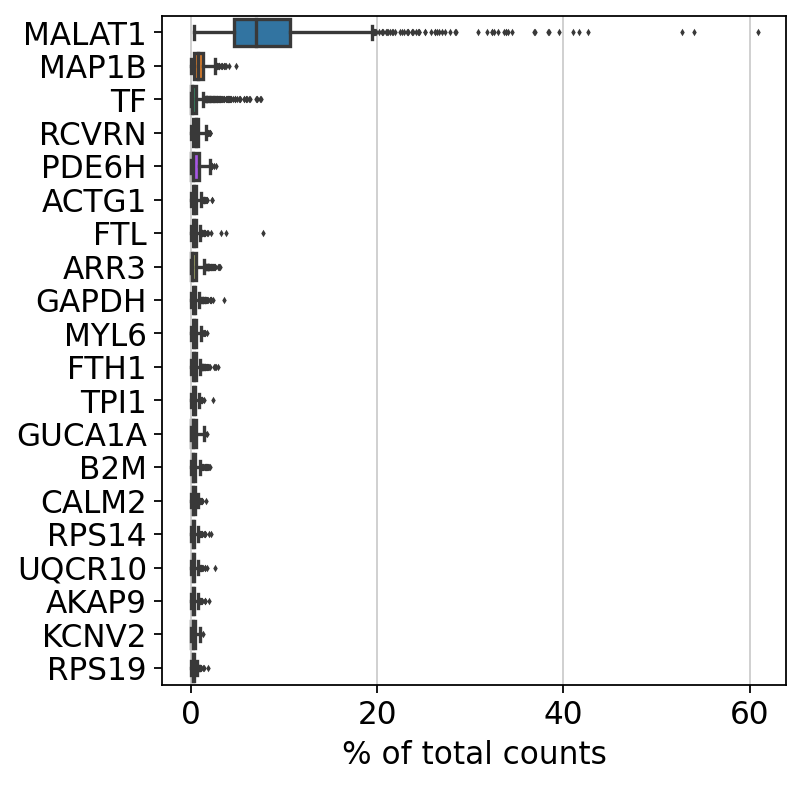

filtered out 94 cells that have less than 600 genes expressed
filtered out 11320 genes that are detected in less than 67 cells


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

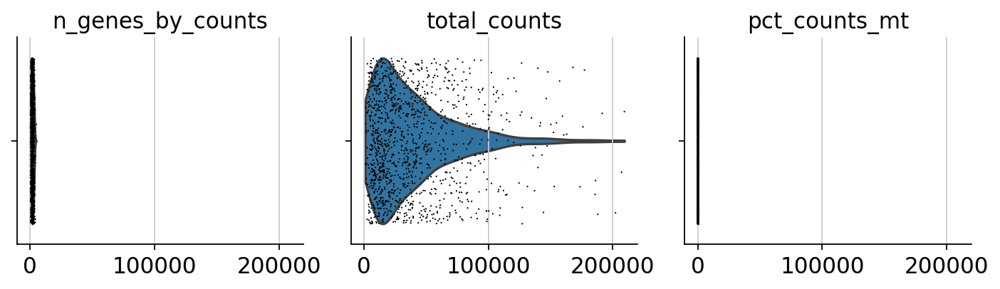

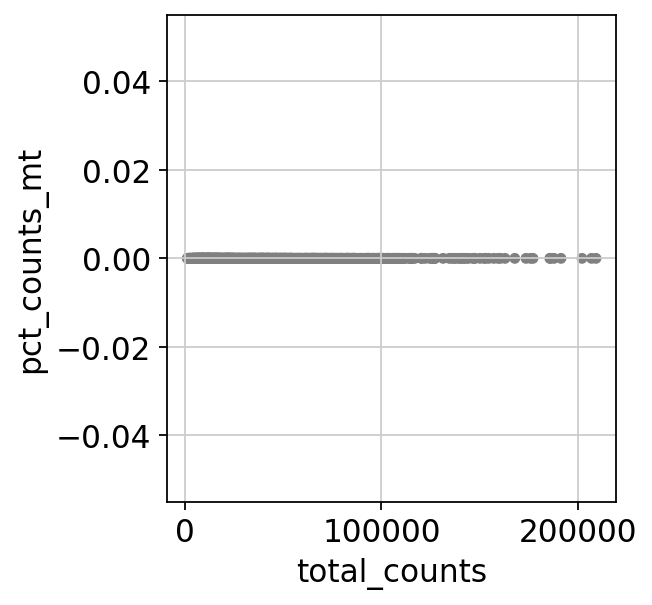

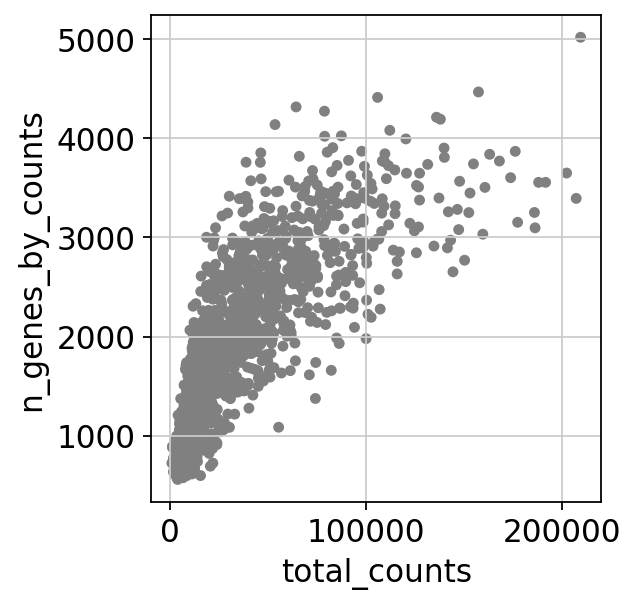

In [18]:
PreprocessSC(data_path = '/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/input/01_Full_Kim_OrganoidData.csv',
             data_type = 'Full_sparse', transpose_data = True)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


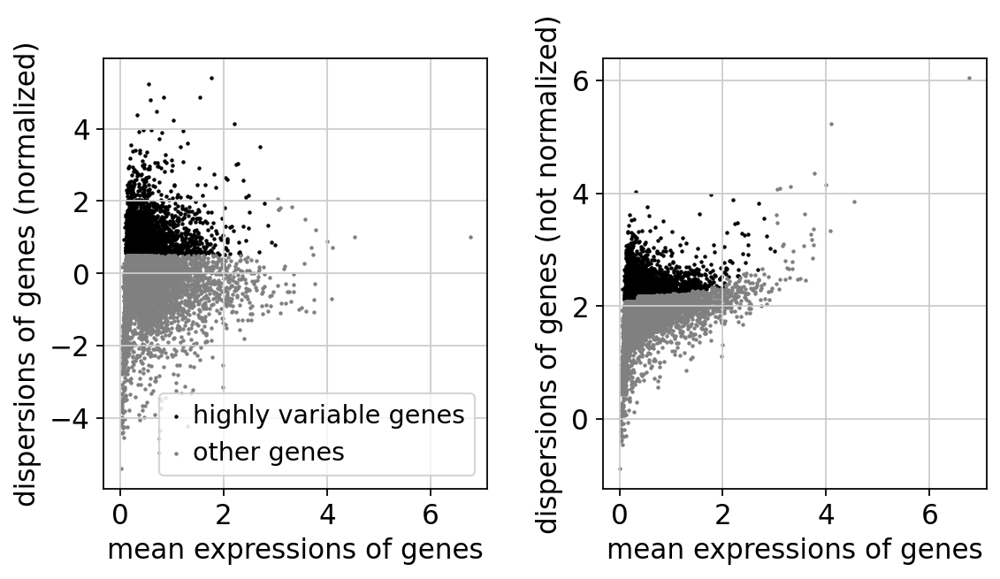

regressing out ['total_counts']
    finished (0:00:06)
computing PCA
    on highly variable genes
    with n_comps=50


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)


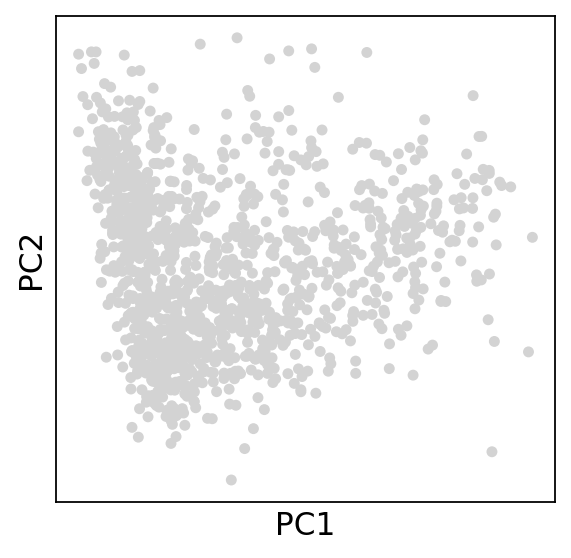

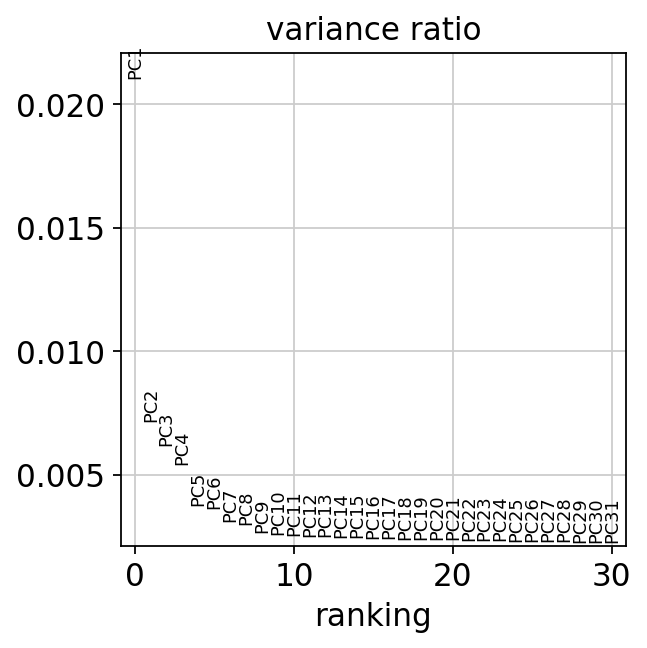

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:08)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


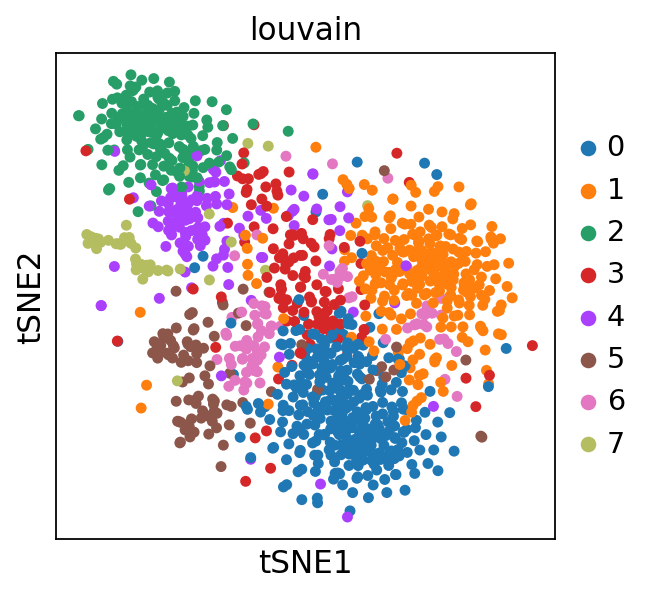

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


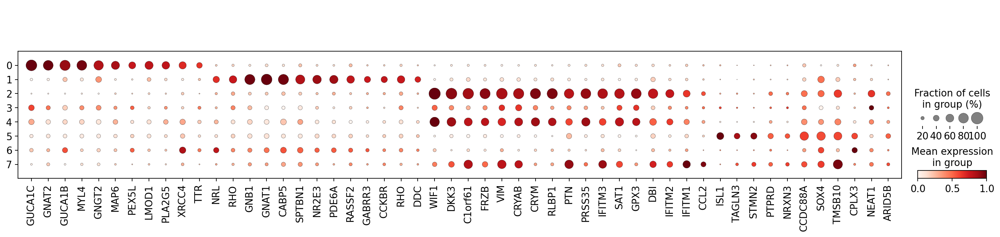

Silhuette coefficient=-0.013677795


In [19]:
ParaTune_Clust(adata_input = adata, 
               marker_genes = MG,
               cutoff_ngenes = 4000, 
               data_type = 'Full')

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


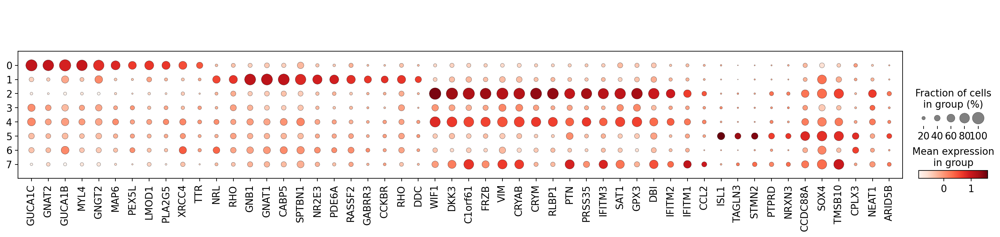

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


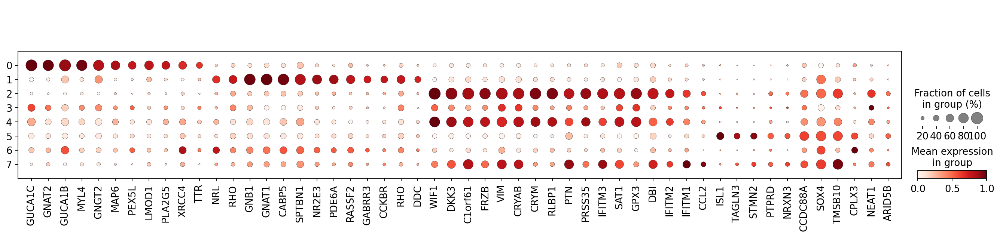

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [ ]:
subset_MG = pd.DataFrame(MG)[0][pd.DataFrame(MG)[0].isin(adata.var_names)].tolist()
    #ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain',standard_scale= 'group', save = 'Dotplot_Kim_RetinaData' + data_type + '_MarkerGenes.svg')
ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain', save = 'Kim_RetinaData_sparse_bare_.svg')
ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain',standard_scale= 'group', save = 'Kim_RetinaData_sparse_scaled_.svg')
ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain',standard_scale= 'group', expression_cutoff = 0.5, save = 'Kim_RetinaData_sparse_scales_cutoff_.svg')

In [16]:
Automatic_Annotation(adata_input = adata, data_set= names_Imp[1])

  CellType      Clusters Size
0    Cones           [0]  323
1     Rods           [1]  268
2       MG        [2, 4]  302
3       NA  [3, 5, 6, 7]  348
4    Mixed            []    0


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

## Automatic annotation and analysis

## Defining parameters

In [ ]:
data = pd.read_table('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/01_BeMa_KIM_ENHANCE.csv', sep=";", decimal =",")
data.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_ENHANCE_reform.csv')

normalizing counts per cell
    finished (0:00:00)


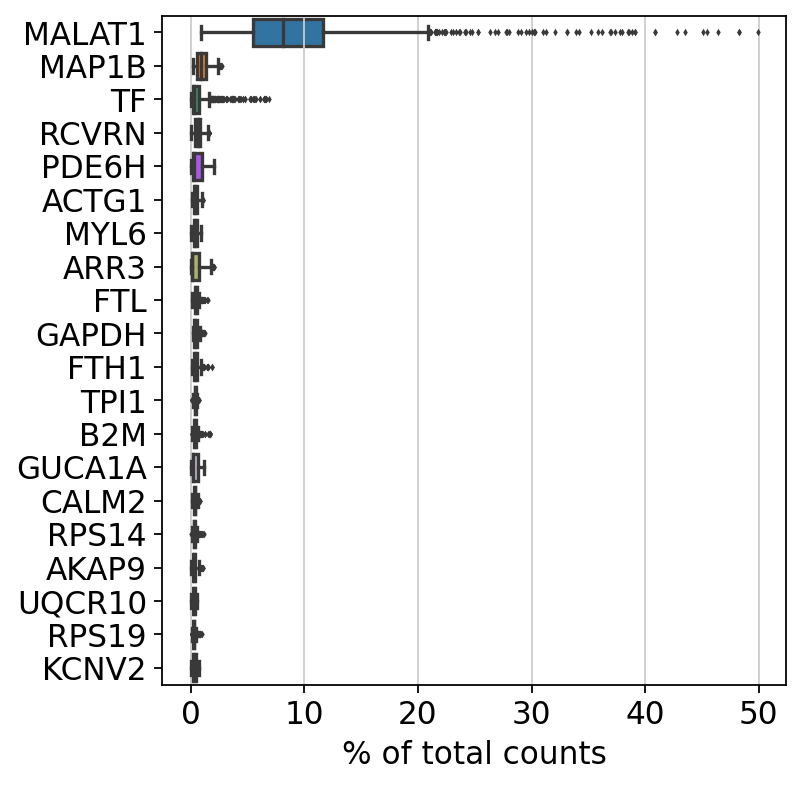

filtered out 5652 genes that are detected in less than 1 counts


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

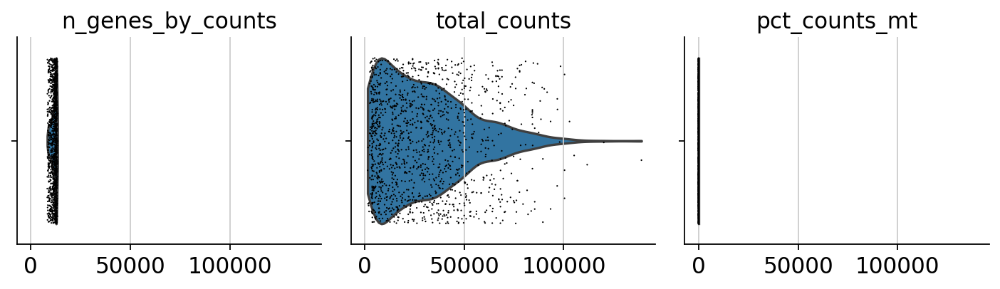

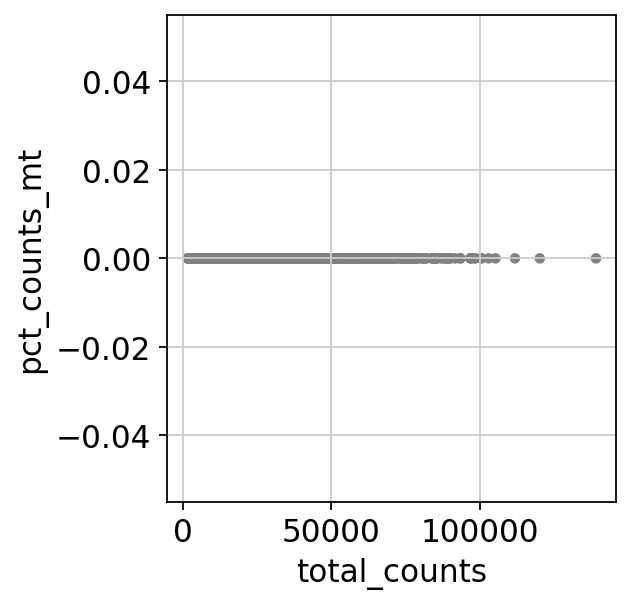

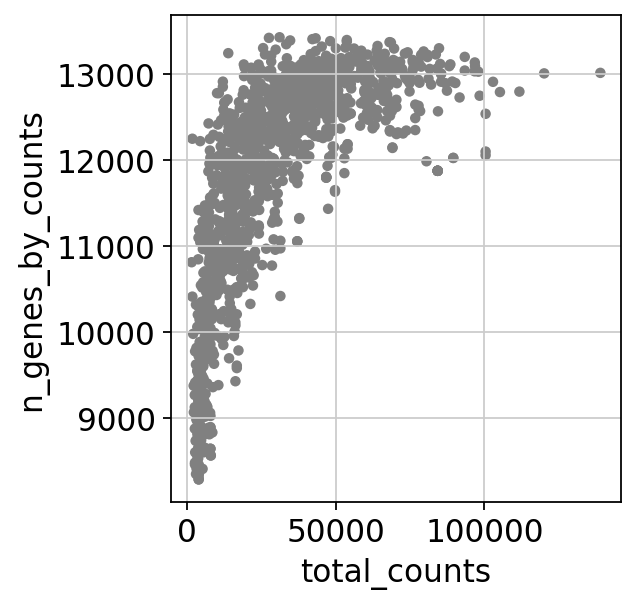

In [11]:
PreprocessSC(data_path = '/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_ENHANCE_reform.csv',
             data_type = 'ENHANCE', transpose_data = True)


normalizing counts per cell
    finished (0:00:00)


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


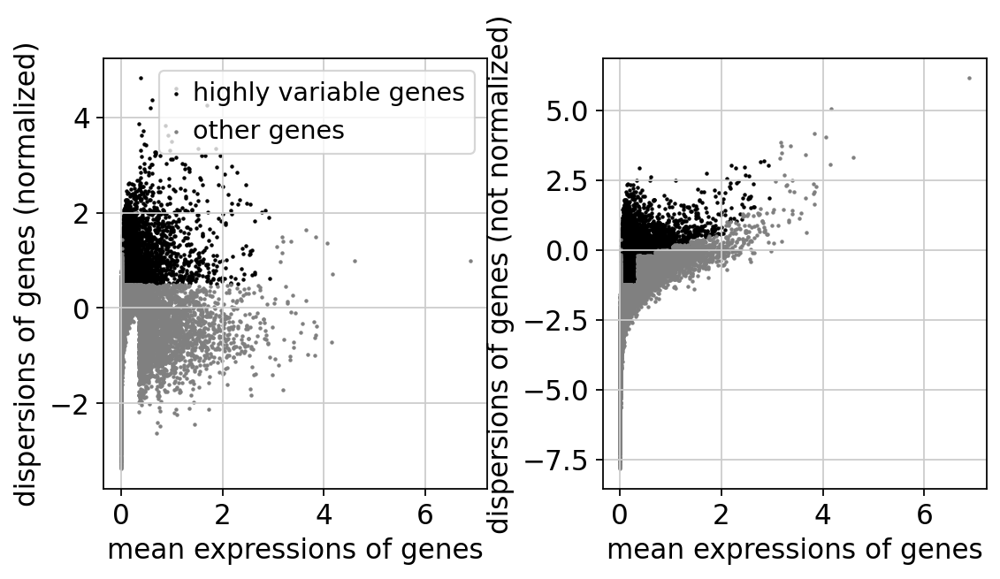

regressing out ['total_counts']
    finished (0:00:31)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


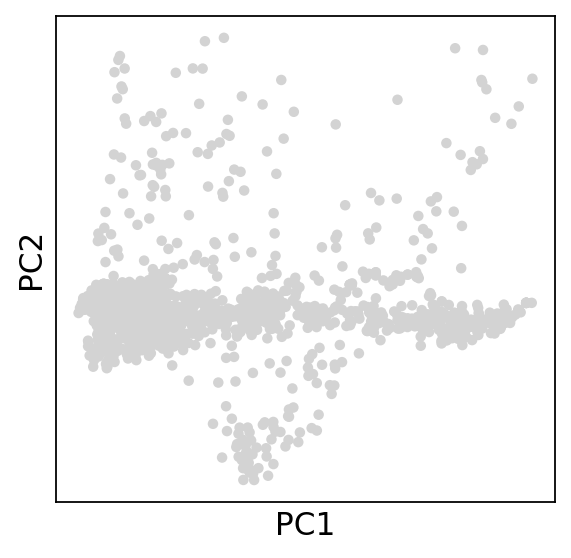

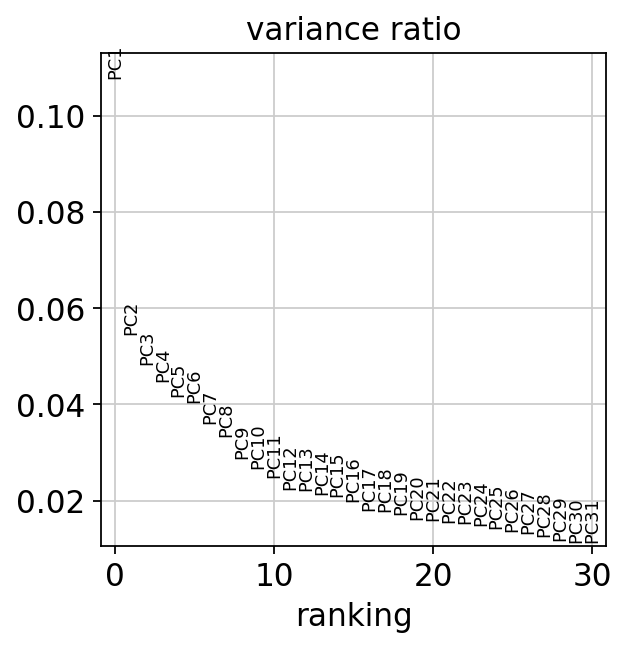

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:09)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 21 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


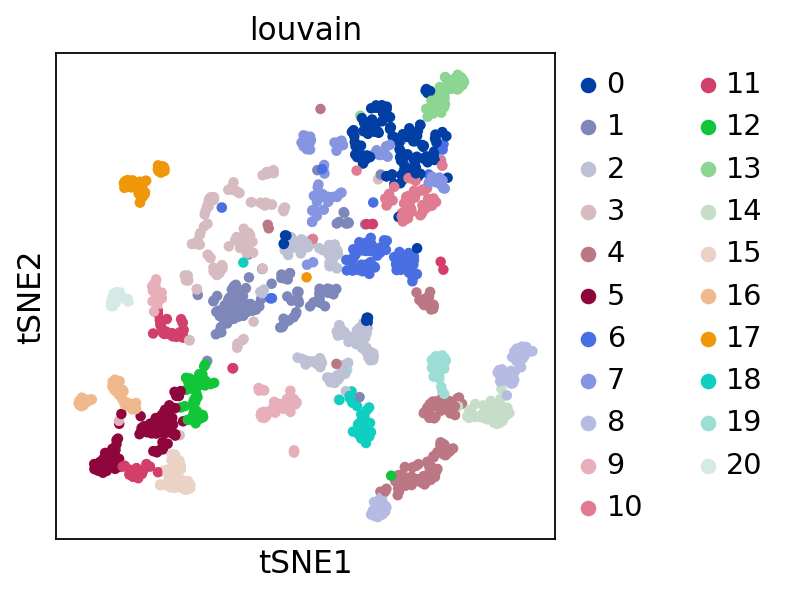

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


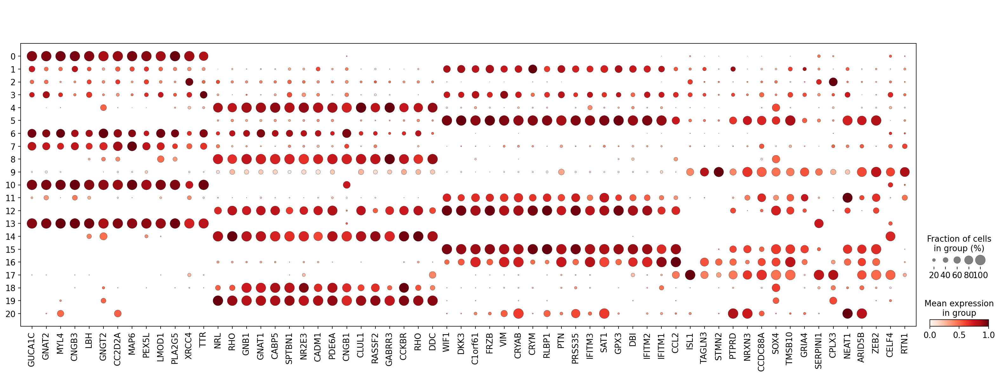

Silhuette coefficient=0.018891657


In [194]:
ParaTune_Clust(adata_input = adata, 
               marker_genes = MG,  
               cutoff_ngenes = 14000, 
               data_type = 'ENHANCE')

In [202]:
# Marker genes of either Cones, Rods and Mueller Glia cells
Cones = ['GUCA1A','ARR3','GUCA1C','PDE6H','GNAT2','GUCA1B','GUK1','MYL4','GNB3','CNGB3','LBH','GNGT2','CC2D2A','MAP6','HRASLS','PEX5L','LMOD1','PLA2G5','XRCC4','TTR']
Rods = ['NRL', 'RHO','ROM1','GNGT1','PDE6G','GNB1','SAG','GNAT1','CABP5','SPTBN1','NR2E3','CADM1','PDE6A','PEEP6','CNGB1','CLUL1','RASSF2','GABRR3','CCKBR','RHO','DDC','SLC24A1']
MuGl = ['CLU','SPP1','WIF1','DKK3','C1orf61','FRZB','VIM','CRYAB','CRYM','RLBP1','PTN','PRSS35','IFITM3','SAT1','GPX3','DBI','TF','IFITM2','IFITM1','CCL2']

names = ("Cones", "Rods", "MuGl")
data = (Cones, Rods, MuGl)
    
    # Annotation us done per cell type (Cones, Rods, MuGl)
    
Final_annot = pd.DataFrame(index= range(0,len(adata.obs["louvain"].cat.categories)))
for i in range(0,3):
        # Overlap genes
    gene_ids = pd.DataFrame(data[i])[0][pd.DataFrame(data[i])[0].isin(adata.var_names)].tolist()
    clusters = adata.obs['louvain'].cat.categories
    if len(gene_ids) > 0:
        obs = adata[:,gene_ids].X.toarray()
    obs = pd.DataFrame(obs,columns=gene_ids,index=adata.obs['louvain'])
        # Purpose: Getting information from dotplot
        # Based on overlapping genes calculate louvain cluster mean per gene
        # Since we added scaling in dotplot normalization
        # mean - min / max - min
    b = (obs.groupby(level = 0).mean() - obs.groupby(level = 0).mean().min()) / (obs.groupby(level = 0).mean().max() -obs.groupby(level = 0).mean().min())
        # Binarization using 0.5 as threshold
    bin_mat = (b > 0.5) *1
        # Cluster gets annotated if 75% of marker genes are above threshold
    bin_mat["Annotation"] = np.where(bin_mat.sum(axis =1) > (0.75* bin_mat.shape [1]), 1, 0)
    Final_annot[str(names[i])] = np.where(bin_mat.sum(axis =1) > (0.75* bin_mat.shape [1]), 1, 0)
    
    # Defining groups= Pure clusters, Mixed annotation, NA (Not assignable)
Final_annot["Pure"] = np.where(Final_annot.iloc[:,0:3].sum(axis =1) == 1 , True, False)
Final_annot["Not assignable"] = np.where(Final_annot.iloc[:,0:3].sum(axis =1) < 1 ,  True, False)
Final_annot["Mixed"] = np.where(Final_annot.iloc[:,0:3].sum(axis =1) >= 2 ,  True, False)
    
    

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [203]:
Final_annot

,Cones,Rods,MuGl,Pure,Not assignable,Mixed
0,1,0,0,True,False,False
1,1,0,0,True,False,False
2,0,0,0,False,True,False
3,1,0,0,True,False,False
4,0,1,0,True,False,False
5,0,0,1,True,False,False
6,1,0,0,True,False,False
7,1,0,0,True,False,False
8,0,1,0,True,False,False
9,0,0,0,False,True,False


In [204]:
#Final_annot.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/results/01_Annotation_Kim_' + str(data_set) + '.csv')
    
# Get louvain cluster number of cell types and Mixed as well as NA results
nCones = Which_clusters(cell_type="Cones", type_ct= "Pure")
nRods = Which_clusters(cell_type="Rods", type_ct= "Pure")
nMG = Which_clusters(cell_type="MuGl", type_ct= "Pure")
nMixed = Which_clusters(cell_type="MuGl", type_ct= "Mixed")
nNA = Which_clusters(cell_type="MuGl", type_ct= "Not_assignable")
    


<ipython-input-110-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-110-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-110-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]


In [207]:
Automatic_Annotation(adata_input = adata, data_set = "ENHANCE")

  CellType                 Clusters Size
0    Cones  [0, 1, 3, 6, 7, 10, 13]  596
1     Rods           [4, 8, 14, 19]  230
2       MG          [5, 11, 15, 16]  213
3       NA       [2, 9, 17, 18, 20]  260
4    Mixed                     [12]   47


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-110-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-110-d88a69d5d7

In [206]:
annot_table

,CellType,Clusters,Size
0,Cones,"[0, 1, 3, 6, 7, 10, 13]",596
1,Rods,"[4, 8, 14, 19]",230
2,MG,"[5, 11, 15, 16]",213
3,NA,"[2, 9, 17, 18, 20]",260
4,Mixed,[12],47


In [118]:
data = pd.read_table('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF.csv', sep=";", decimal =",")
data.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF_reform.csv')

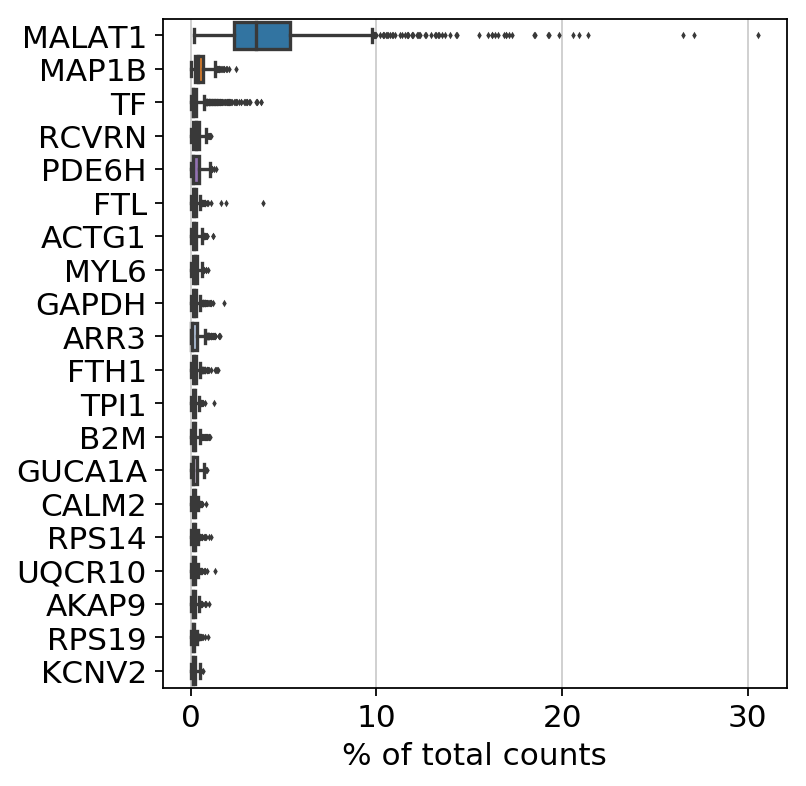

saving figure to file ./figures/violinVIOLIN_Kim_RetinaData_scNPF_Kim.svg


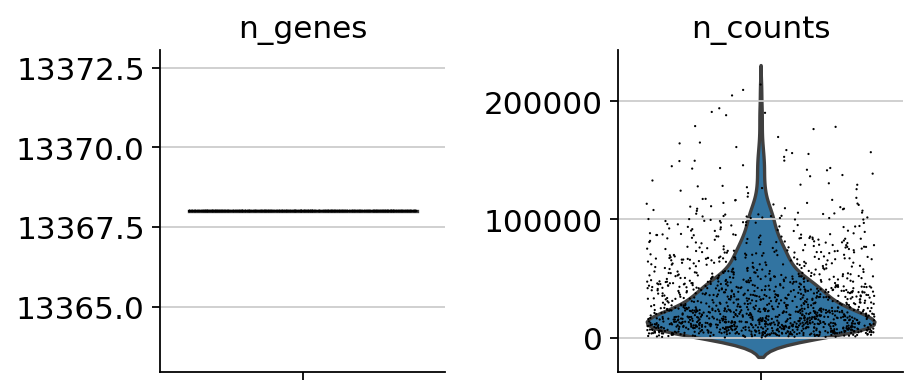

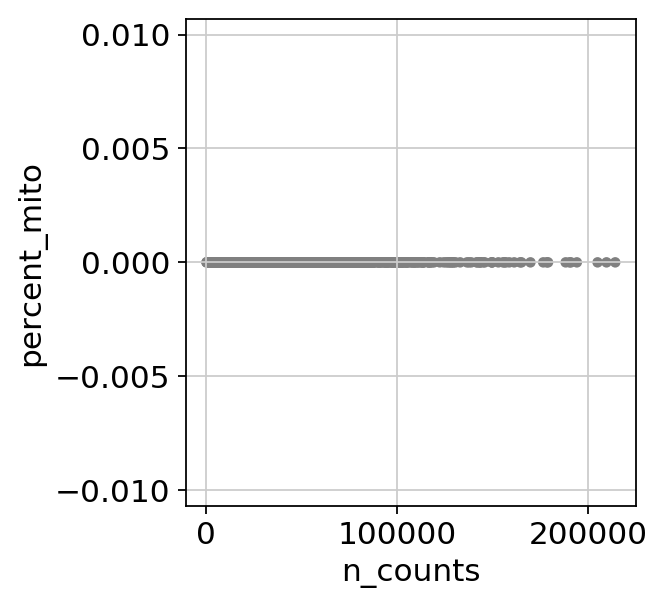

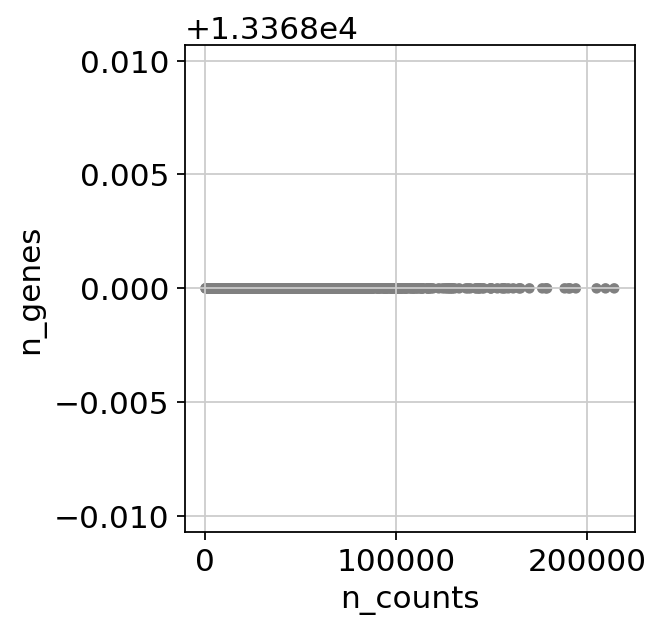

In [371]:
PreprocessSC(data_path = '/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF_reform.csv',
             data_type = 'scNPF_Kim')


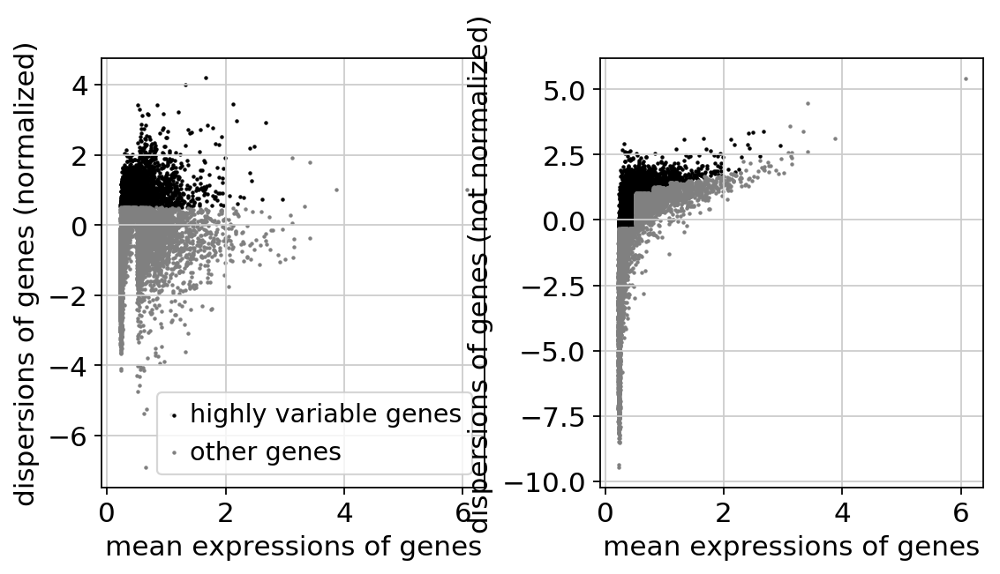

regressing out ['n_counts', 'percent_mito']
    finished (0:00:11.76)


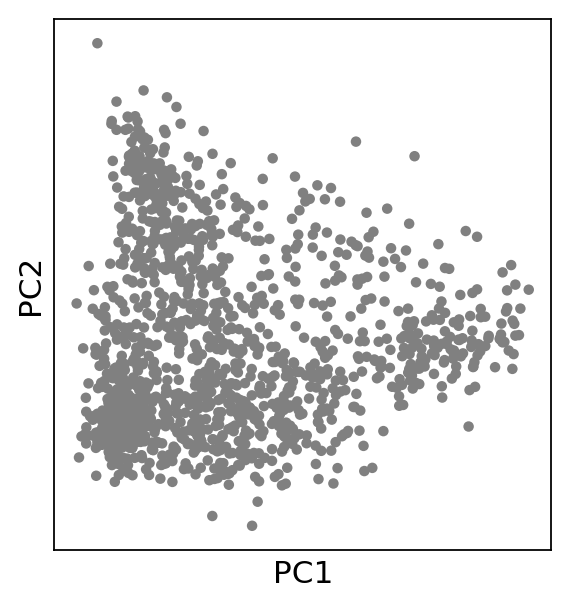

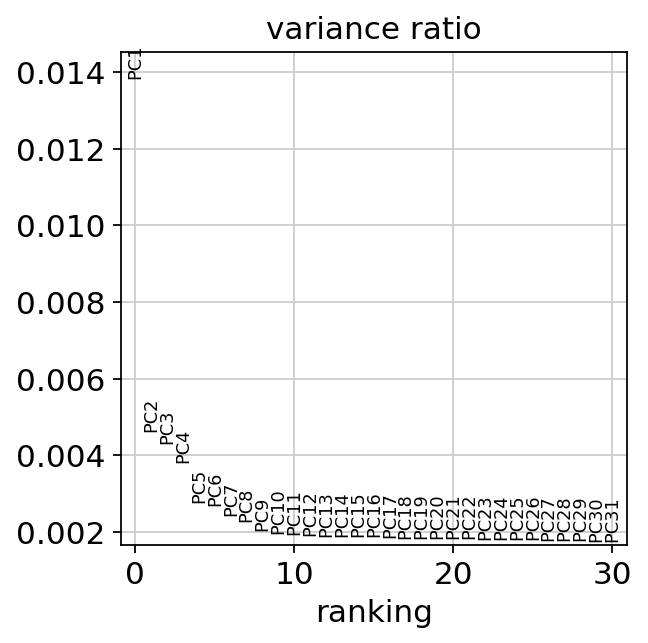

computing neighbors
    using 'X_pca' with n_pcs = 40


/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:00.53) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished (0:00:38.51) --> added
    'X_tsne', tSNE coordinates (adata.obsm)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.08) --> found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
saving figure to file ./figures/tsneUMAP_Kim_RetinaDatascNPF_Kim_Louvain.svg


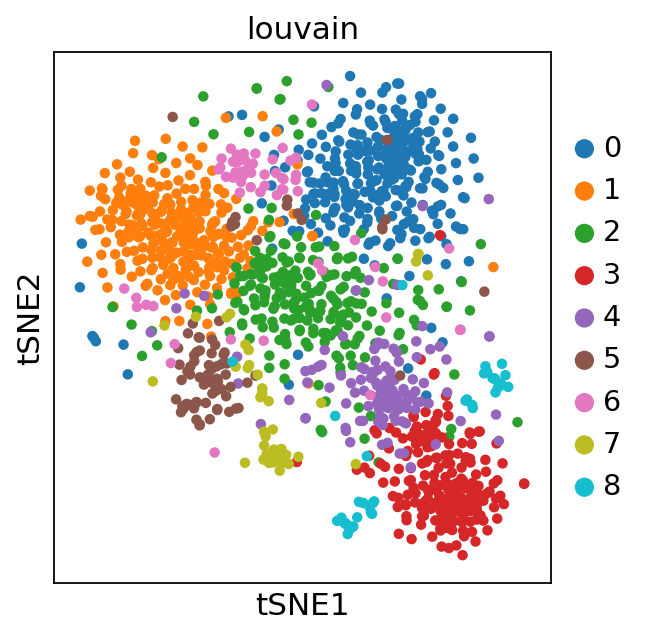

saving figure to file ./figures/dotplotDotplot_Kim_RetinaDatascNPF_Kim_MarkerGenes.svg


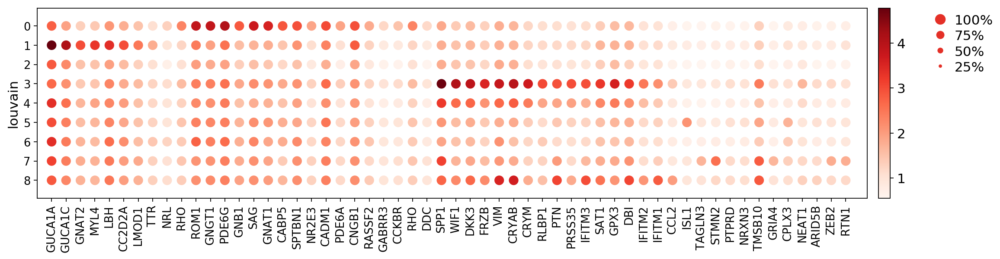

Silhuette coefficient=-0.029687675


In [372]:
ParaTune_Clust(adata_input = adata, 
               marker_genes = MG,  
            cutoff_ngenes = 13369, 
               data_type = 'scNPF_Kim')

In [258]:
Cones = "0"
Rods = '1'
MG = "3","4","8"
Rest = '5', '7'
NA = '2','6'

all_cell_types = [Cones, Rods, MG, Rest, NA]
all_cell_types_names = ["Cones", "Rods", 'MG', "Rest", 'NA']
Get_count_table(adata = adata, all_cell_types = all_cell_types,
               all_cell_types_names = all_cell_types_names)

,CellType,Clusters,Size
0,Cones,0,293
1,Rods,1,275
2,MG,"('3', '4', '8')",356
3,Rest,"('5', '7')",122
4,NA,"('2', '6')",300


In [121]:
data = pd.read_table('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF_String.csv', sep=";", decimal =",")
data.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF_String_reform.csv')

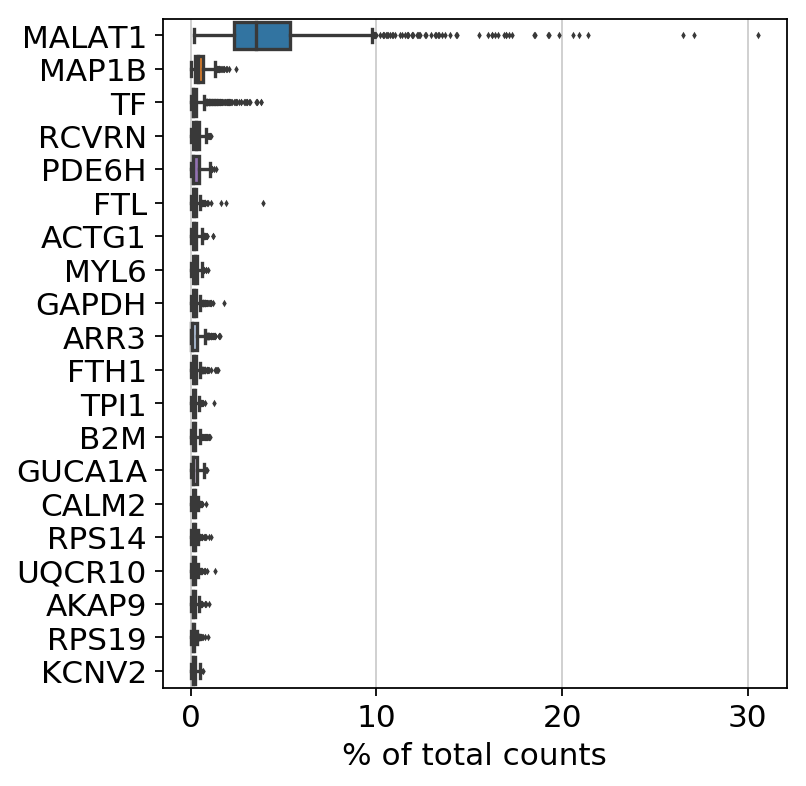

saving figure to file ./figures/violinVIOLIN_Kim_RetinaData_scNPF_String_Kim.svg


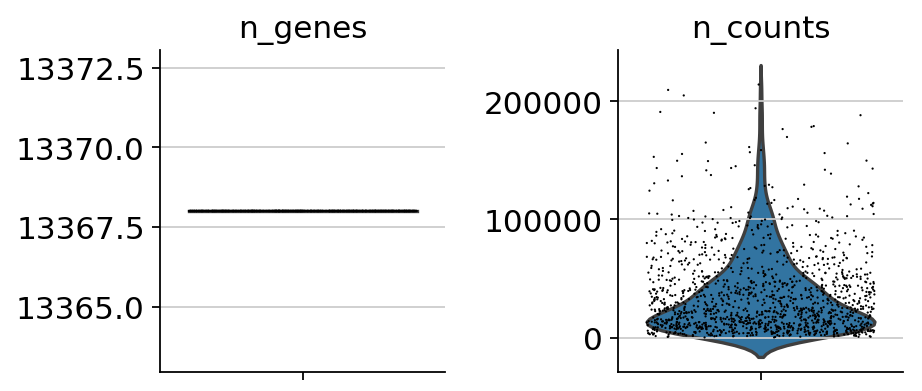

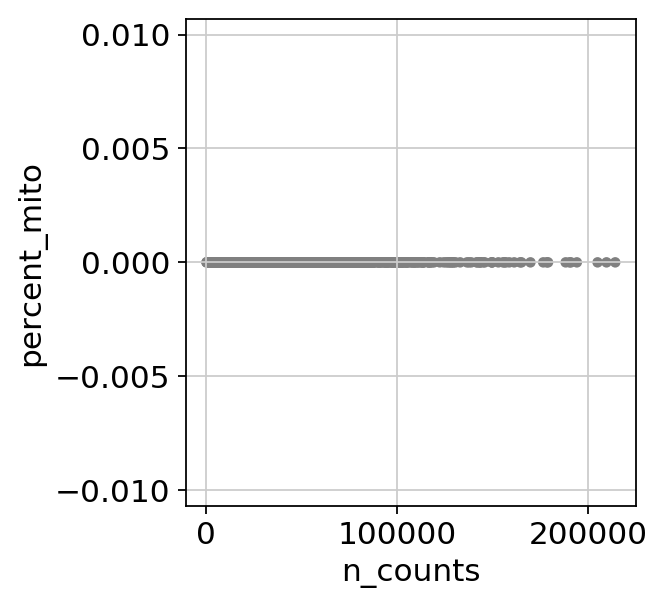

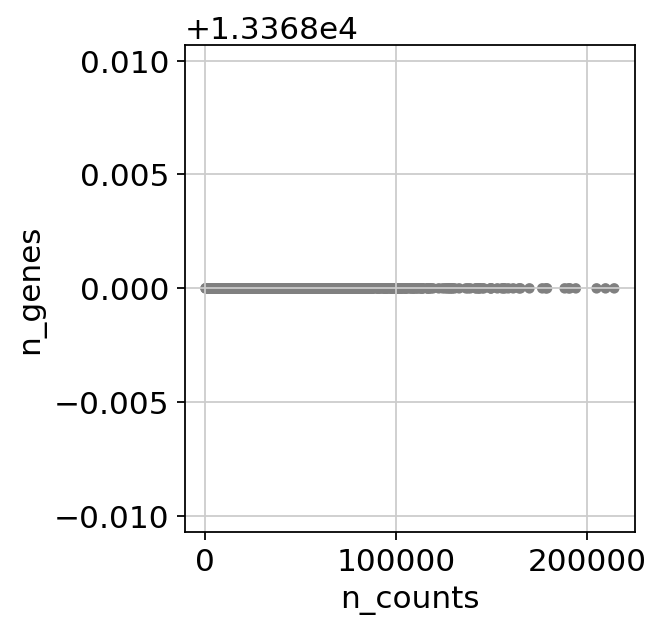

In [373]:
PreprocessSC(data_path = '/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF_reform.csv',
             data_type = 'scNPF_String_Kim')


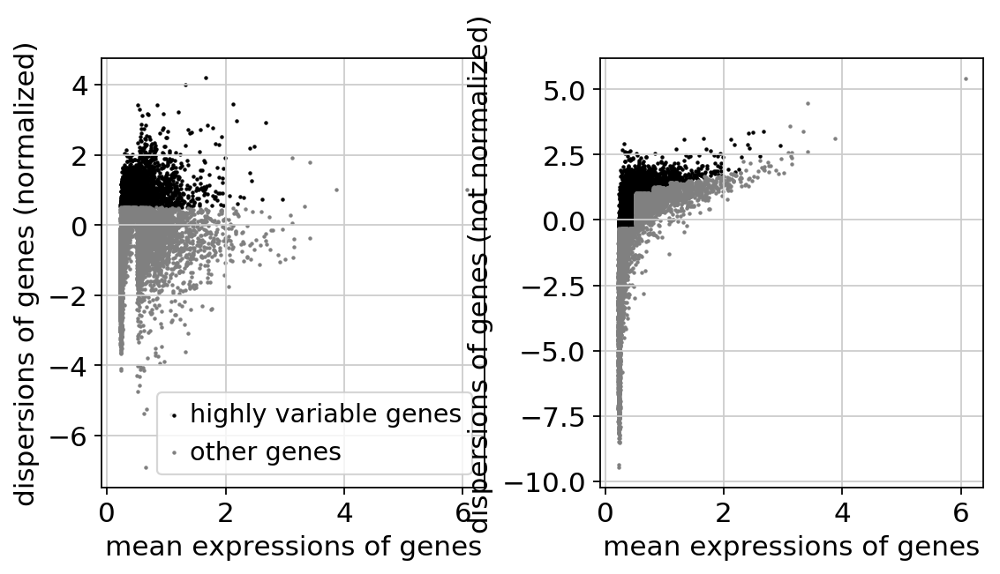

regressing out ['n_counts', 'percent_mito']
    finished (0:00:12.28)


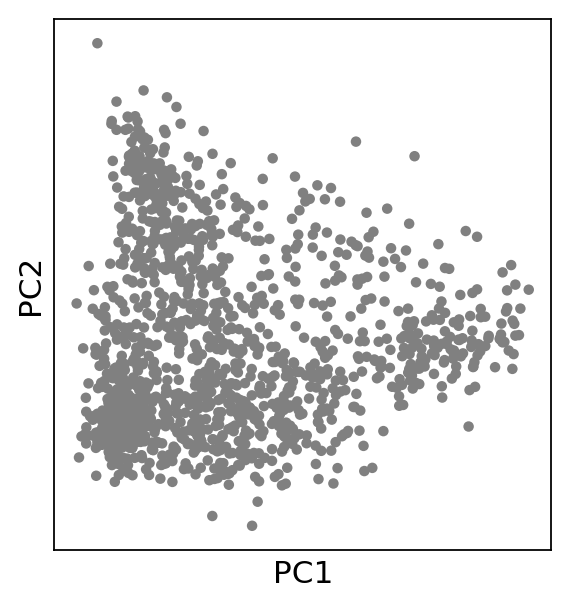

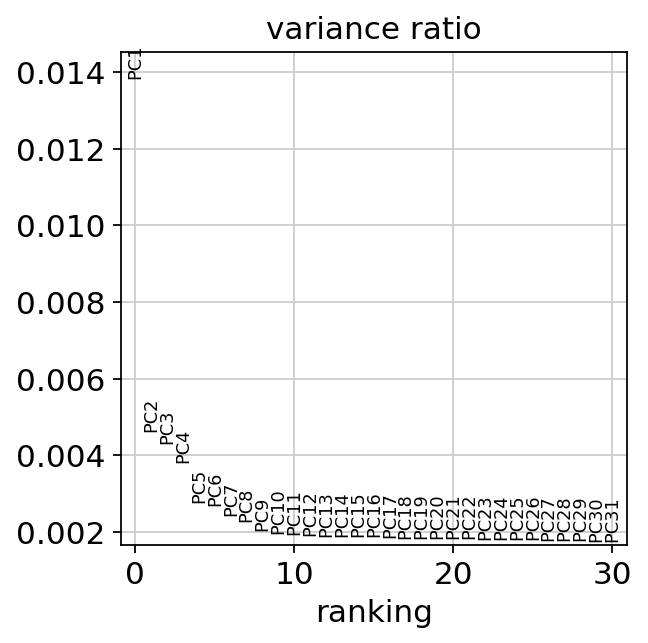

computing neighbors
    using 'X_pca' with n_pcs = 40


/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:00.59) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished (0:00:39.20) --> added
    'X_tsne', tSNE coordinates (adata.obsm)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.08) --> found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
saving figure to file ./figures/tsneUMAP_Kim_RetinaDatascNPF_String_Kim_Louvain.svg


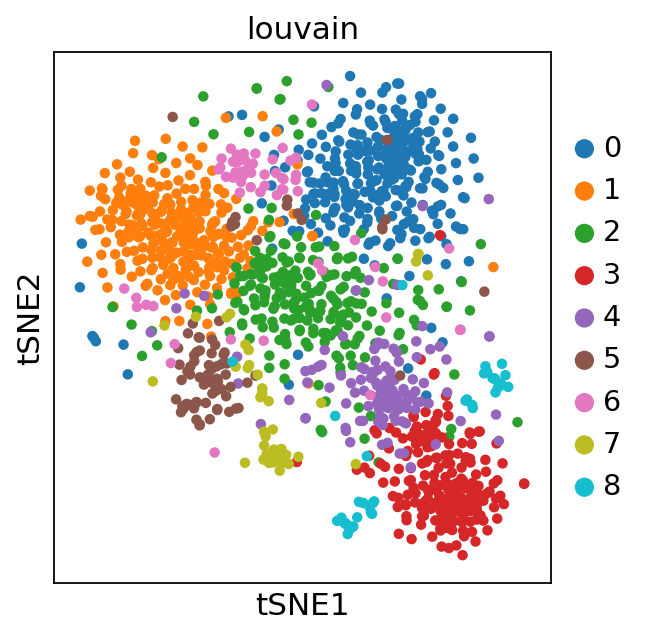

saving figure to file ./figures/dotplotDotplot_Kim_RetinaDatascNPF_String_Kim_MarkerGenes.svg


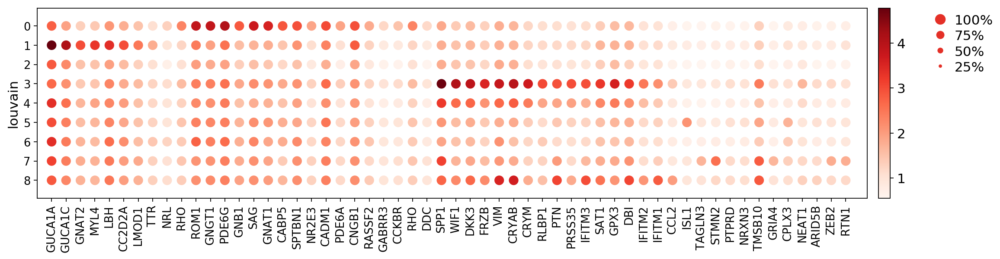

Silhuette coefficient=-0.029687675


In [374]:
ParaTune_Clust(adata_input = adata, 
               marker_genes = MG,  
            cutoff_ngenes = 13369, 
               data_type = 'scNPF_String_Kim')

In [268]:
Cones = "1"
Rods = '0'
MG = "3","4","8"
Rest = '7'
NA = '2','6', '5'

all_cell_types = [Cones, Rods, MG, Rest, NA]
all_cell_types_names = ["Cones", "Rods", 'MG', "Rest", 'NA']
Get_count_table(adata = adata, all_cell_types = all_cell_types,
               all_cell_types_names = all_cell_types_names)

,CellType,Clusters,Size
0,Cones,1,275
1,Rods,0,293
2,MG,"('3', '4', '8')",356
3,Rest,7,45
4,NA,"('2', '6', '5')",377


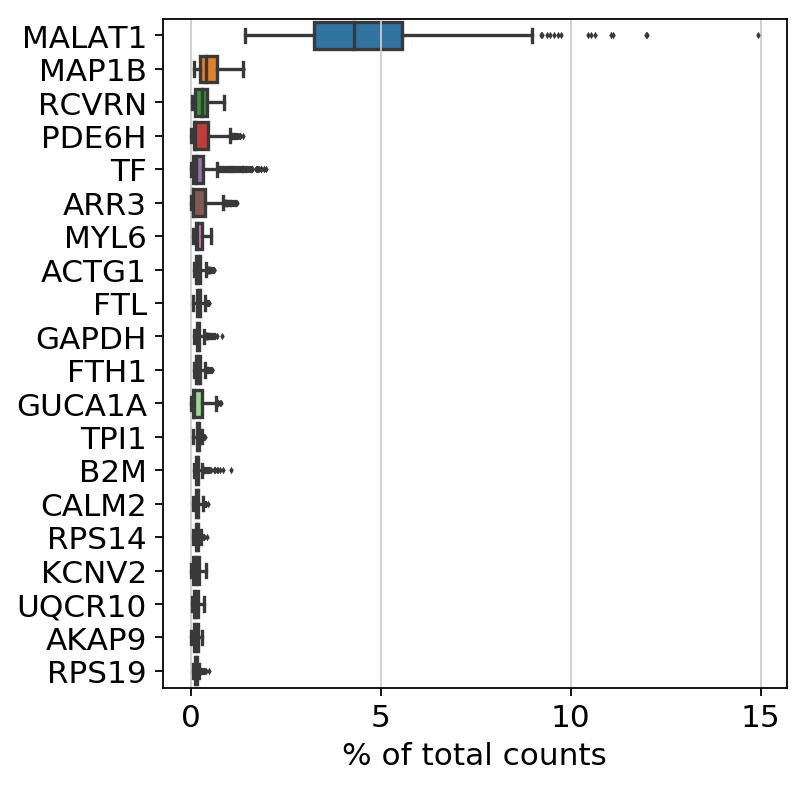

saving figure to file ./figures/violinVIOLIN_Kim_RetinaData_DCA_Kim.svg


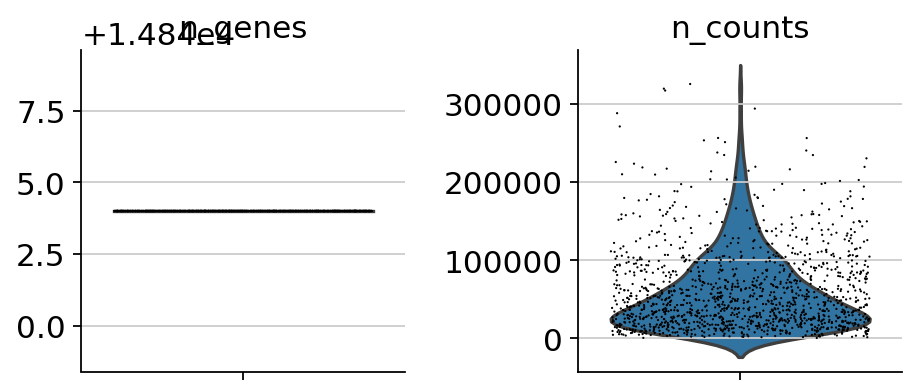

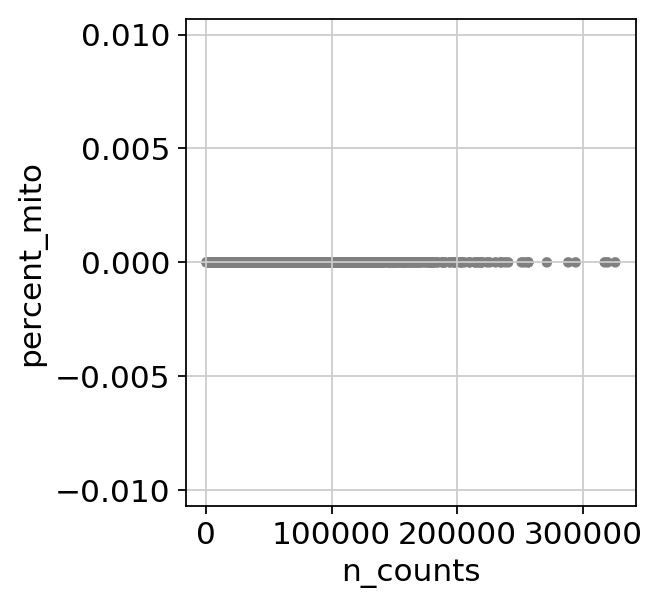

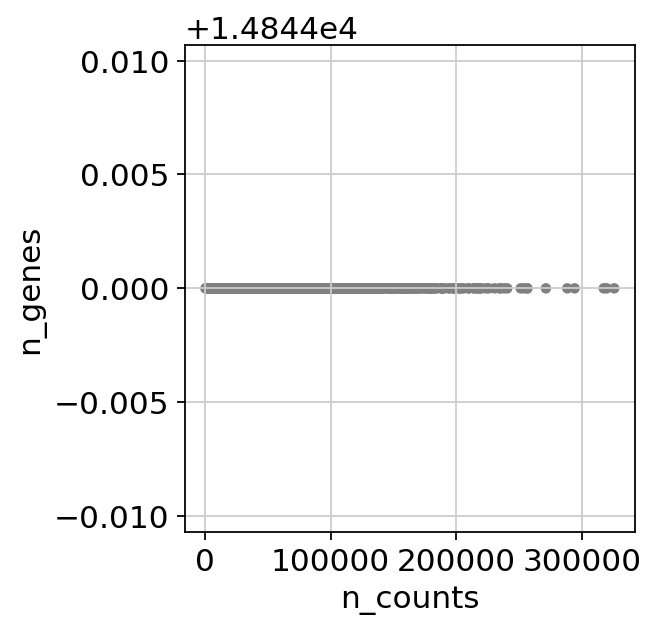

In [375]:
PreprocessSCnoT(data_path = '/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_DCA.csv',
             data_type = 'DCA_Kim')


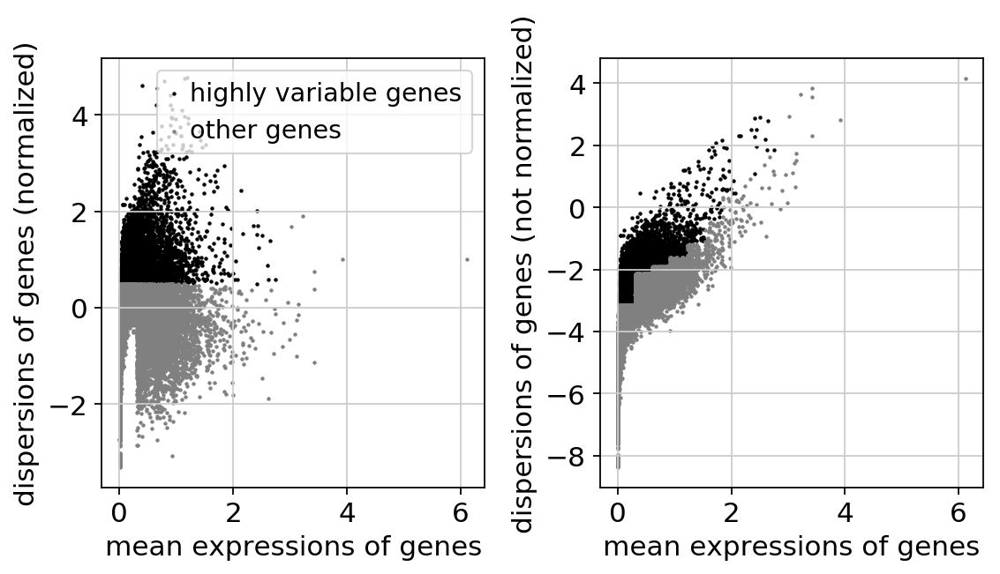

regressing out ['n_counts', 'percent_mito']
    finished (0:00:11.12)


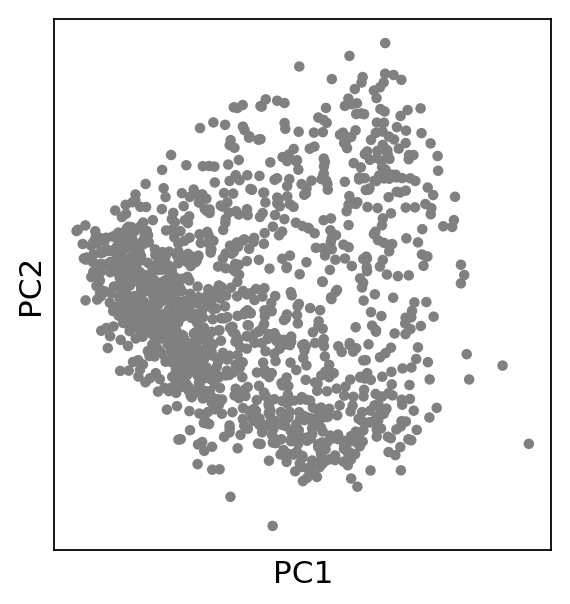

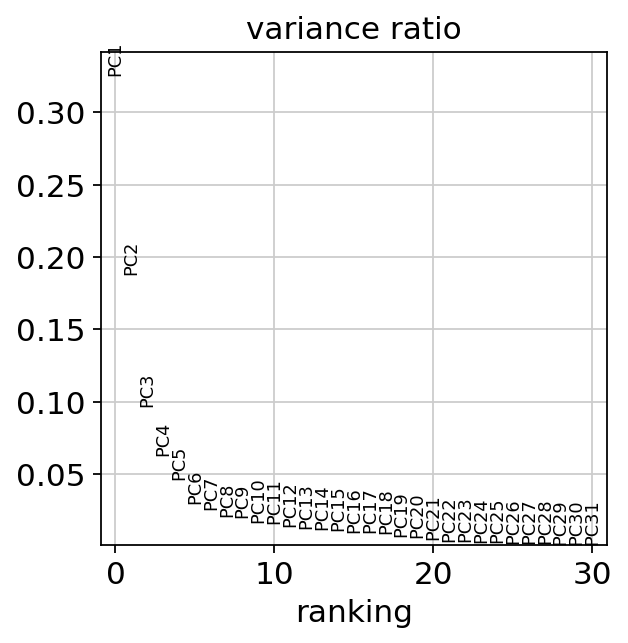

computing neighbors
    using 'X_pca' with n_pcs = 40


/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:00.53) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished (0:00:33.94) --> added
    'X_tsne', tSNE coordinates (adata.obsm)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.05) --> found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
saving figure to file ./figures/tsneUMAP_Kim_RetinaDataDCA_Kim_Louvain.svg


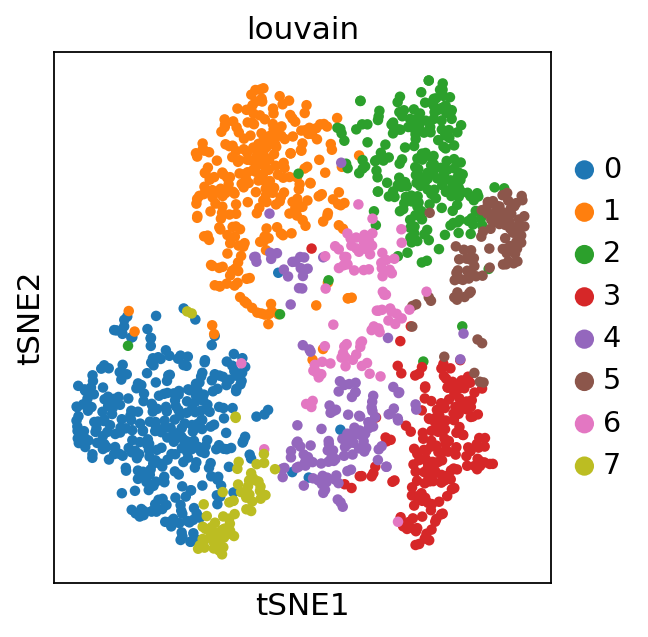

saving figure to file ./figures/dotplotDotplot_Kim_RetinaDataDCA_Kim_MarkerGenes.svg


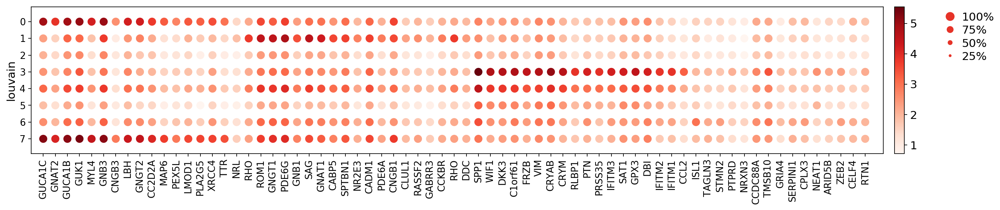

Silhuette coefficient=0.13537225


In [376]:
ParaTune_Clust(adata_input = adata, 
               marker_genes = MG,  
               cutoff_ngenes = 14845, 
               data_type = 'DCA_Kim')

In [286]:
Cones = "0", "7"
Rods = '1'
MG = "3"
Rest = '6'
NA = '2', '5', "4"

all_cell_types = [Cones, Rods, MG, Rest, NA]
all_cell_types_names = ["Cones", "Rods", 'MG', "Rest", 'NA']
Get_count_table(adata = adata, all_cell_types = all_cell_types,
               all_cell_types_names = all_cell_types_names)

,CellType,Clusters,Size
0,Cones,"('0', '7')",387
1,Rods,1,273
2,MG,3,175
3,Rest,6,86
4,NA,"('2', '5', '4')",425


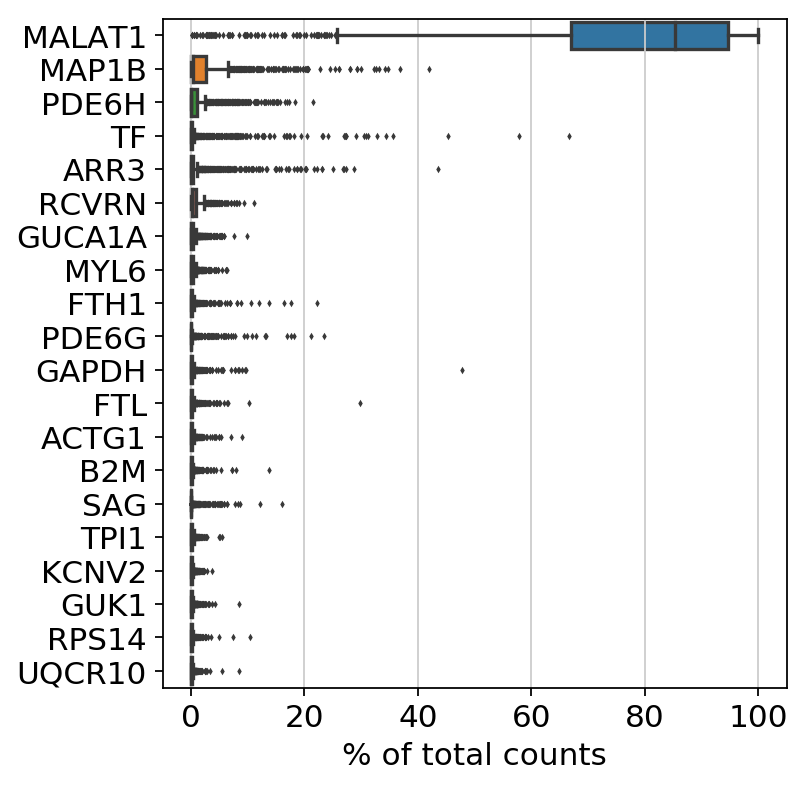

filtered out 4988 genes that are detected in less than 67 cells
saving figure to file ./figures/violinVIOLIN_Kim_RetinaData_DrImpute_Kim.svg


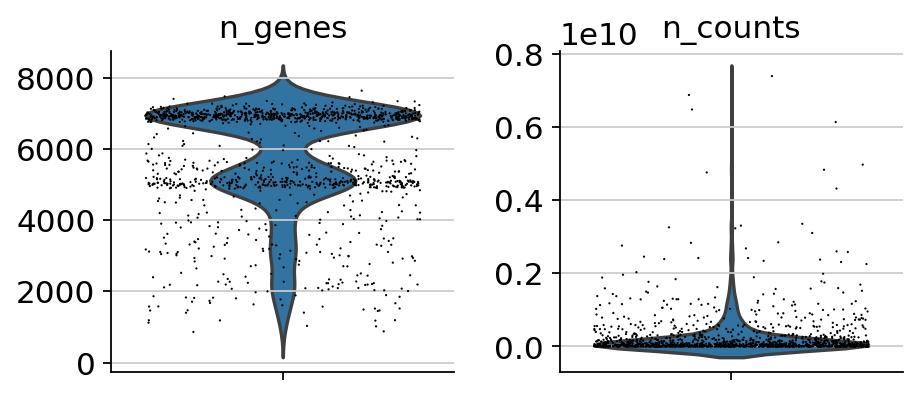

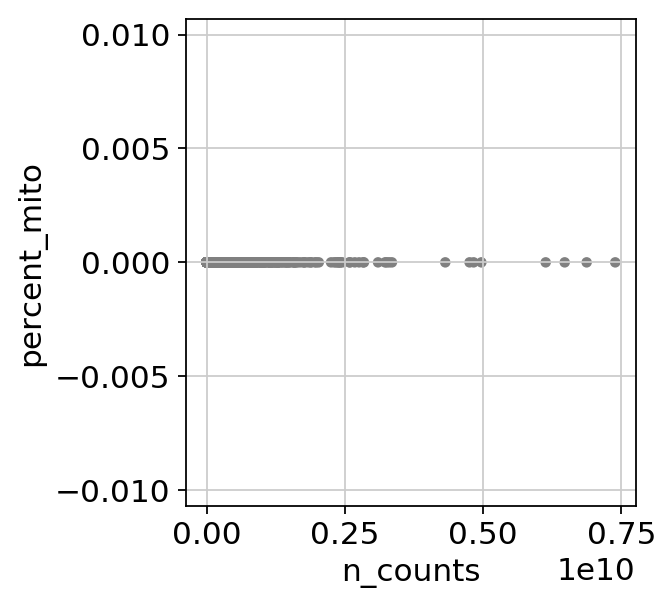

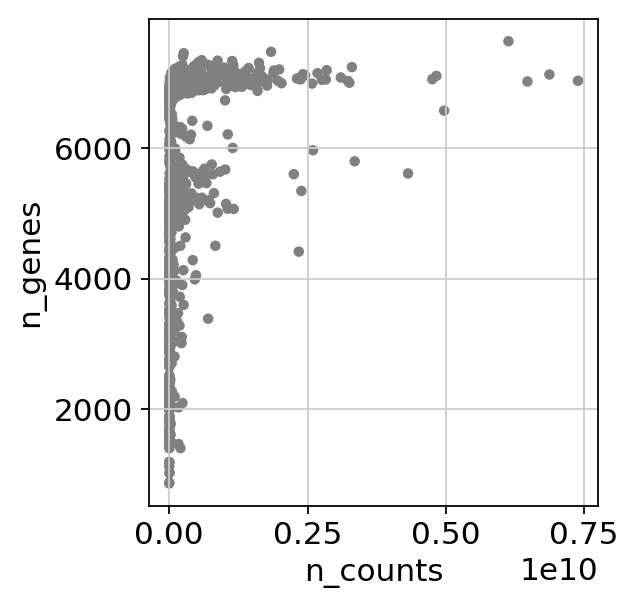

In [377]:
data = pd.read_table('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_DrImpute.csv', sep=";", decimal =",")
data.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_DrImpute_reform.csv')
PreprocessSC(data_path = '/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_DrImpute_reform.csv',
             data_type = 'DrImpute_Kim')

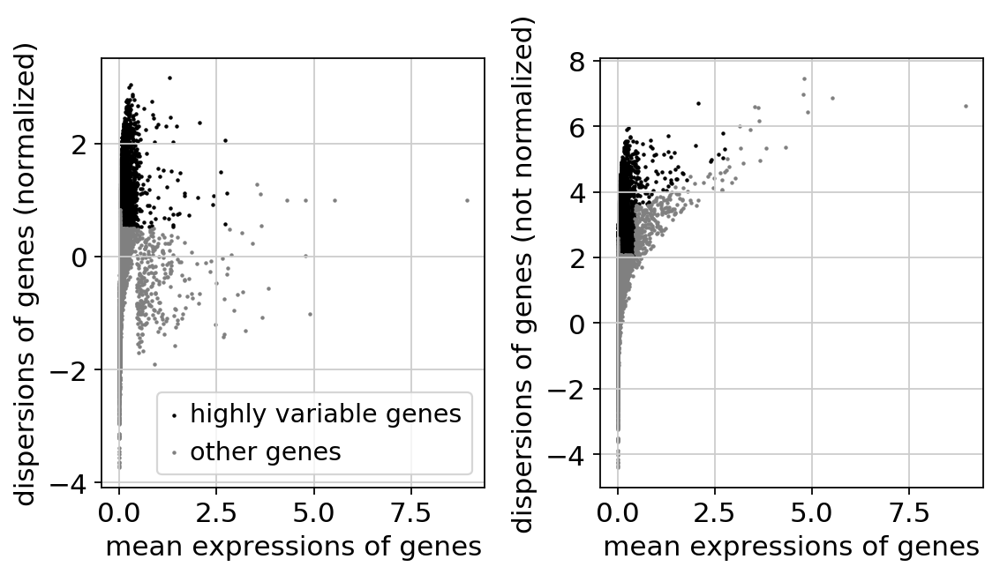

regressing out ['n_counts', 'percent_mito']
    finished (0:00:06.27)


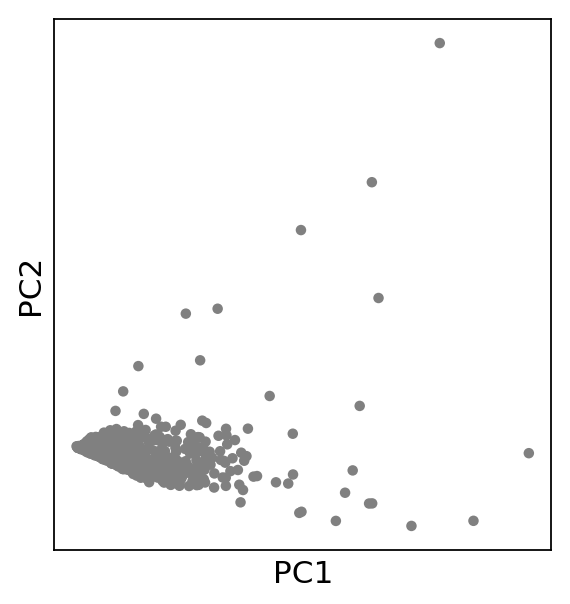

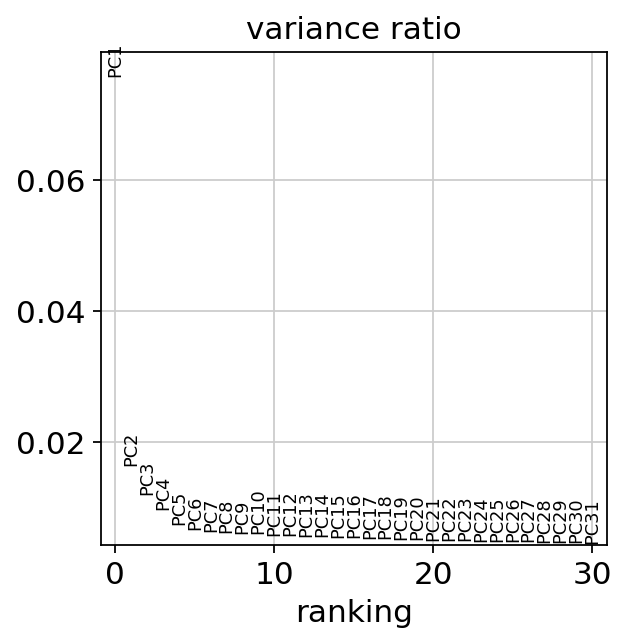

computing neighbors
    using 'X_pca' with n_pcs = 40


/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:00.54) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished (0:00:36.85) --> added
    'X_tsne', tSNE coordinates (adata.obsm)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.07) --> found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
saving figure to file ./figures/tsneUMAP_Kim_RetinaDataDrImpute_Kim_Louvain.svg


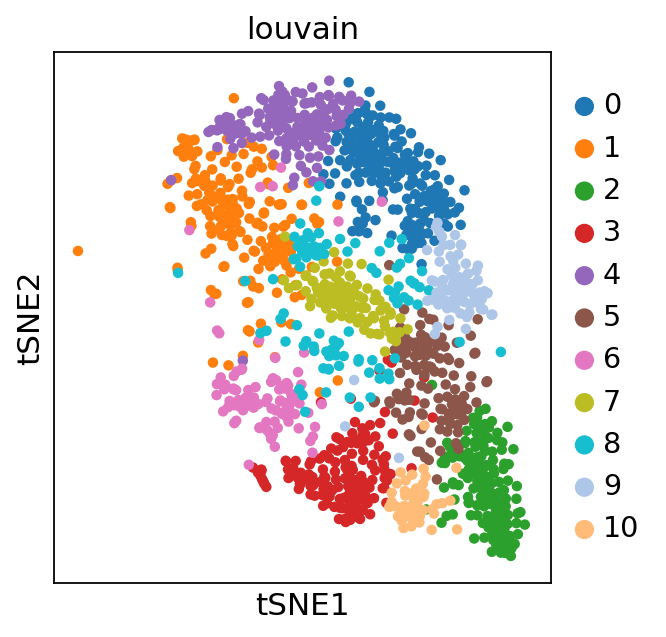

saving figure to file ./figures/dotplotDotplot_Kim_RetinaDataDrImpute_Kim_MarkerGenes.svg


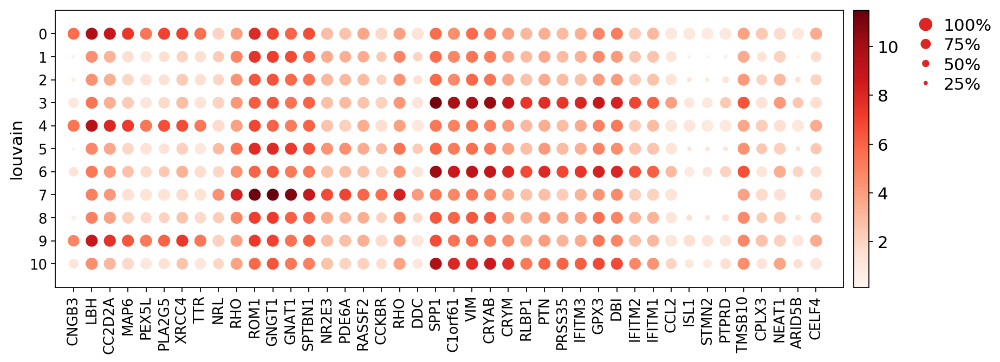

Silhuette coefficient=-0.17526397


In [378]:
ParaTune_Clust(adata_input = adata, 
               marker_genes = MG,  
               cutoff_ngenes = 7900, 
               data_type = 'DrImpute_Kim')

In [317]:
Cones = "0", "4", "9"
Rods = '7'
MG = "3", "6", "10"
NA = '1', '2', "5", "8"

all_cell_types = [Cones, Rods, MG ,NA]
all_cell_types_names = ["Cones", "Rods", 'MG', 'NA']
Get_count_table(adata = adata, all_cell_types = all_cell_types, all_cell_types_names = all_cell_types_names )

,CellType,Clusters,Size
0,Cones,"('0', '4', '9')",407
1,Rods,7,94
2,MG,"('3', '6', '10')",289
3,NA,"('1', '2', '5', '8')",556


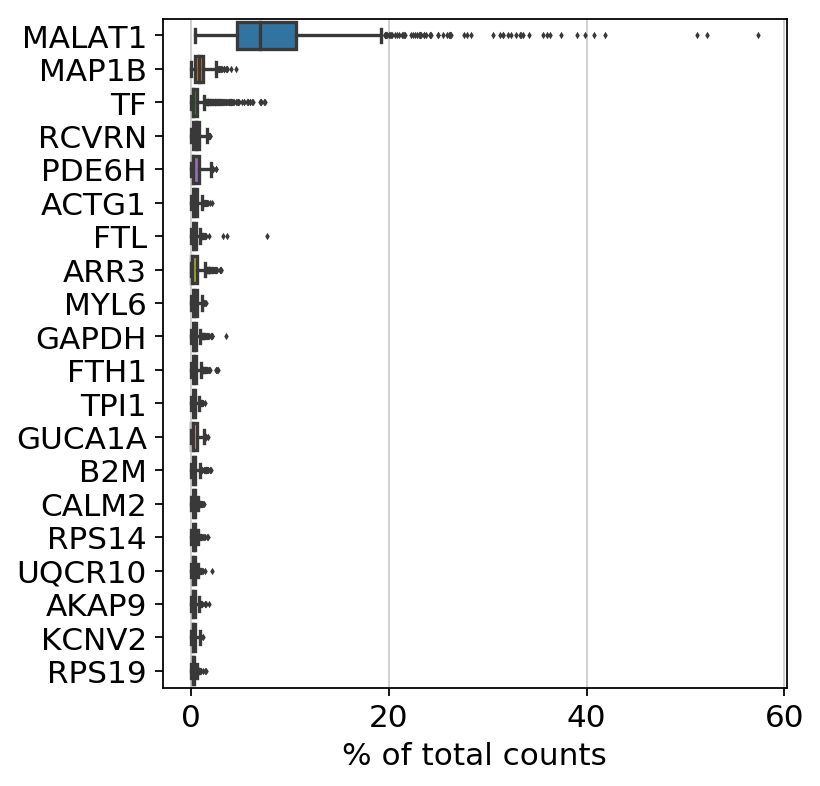

saving figure to file ./figures/violinVIOLIN_Kim_RetinaData_SAVER_Kim.svg


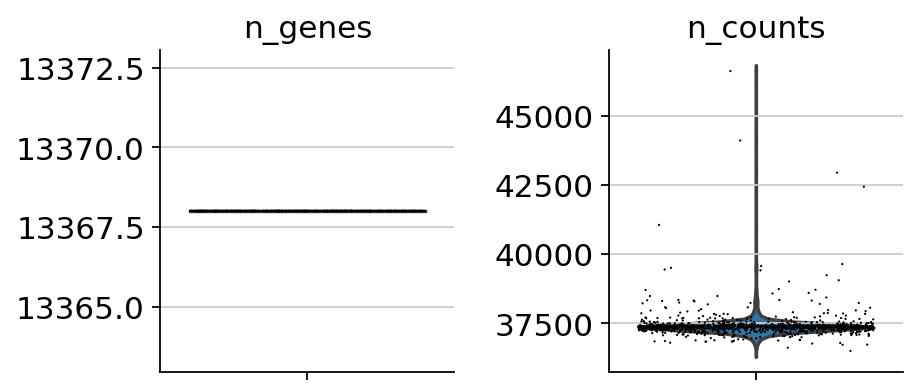

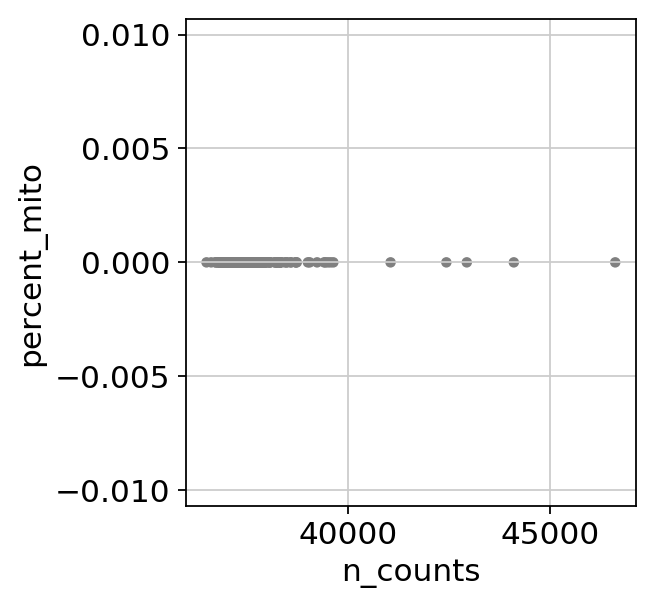

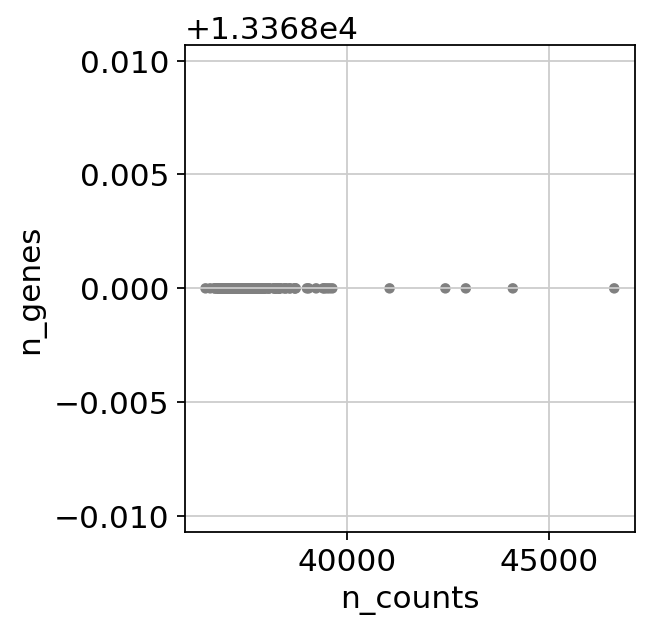

In [379]:
data = pd.read_table('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/01_BeMa_KIM_SAVER.csv', sep=";", decimal =",")
data.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_SAVER_reform.csv')
PreprocessSC(data_path = '/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_SAVER_reform.csv',
             data_type = 'SAVER_Kim')

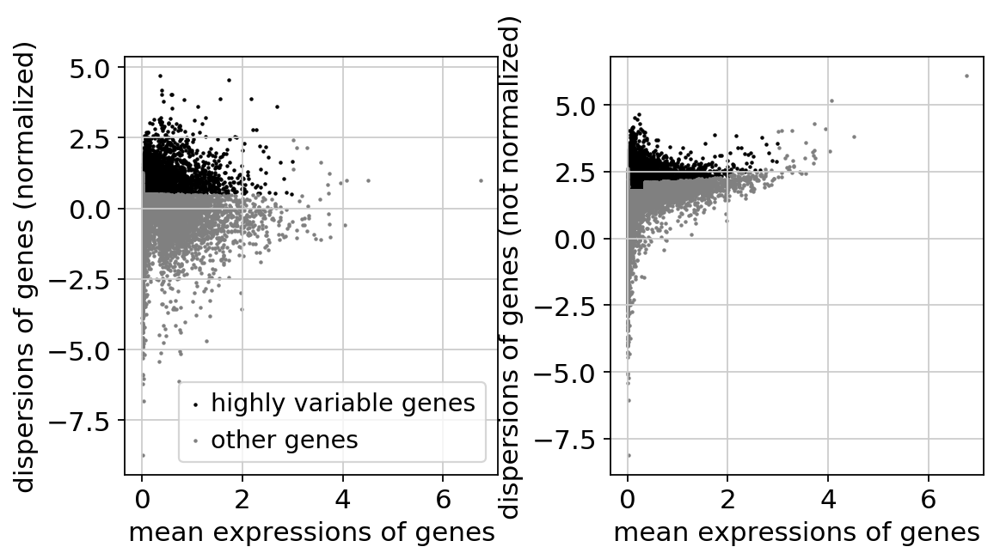

regressing out ['n_counts', 'percent_mito']
    finished (0:00:09.40)


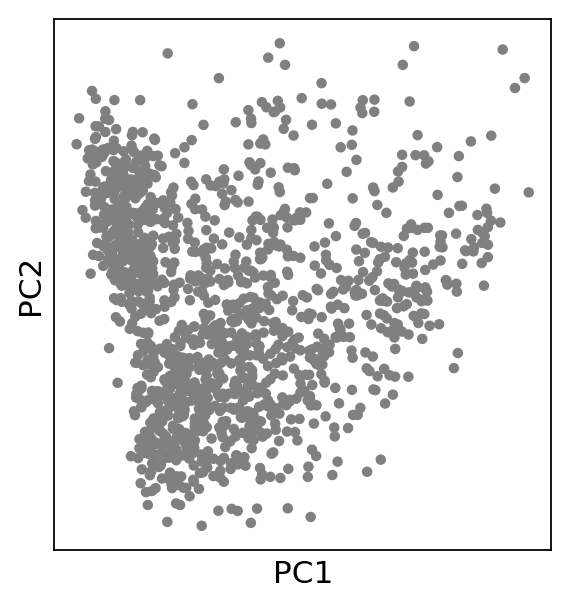

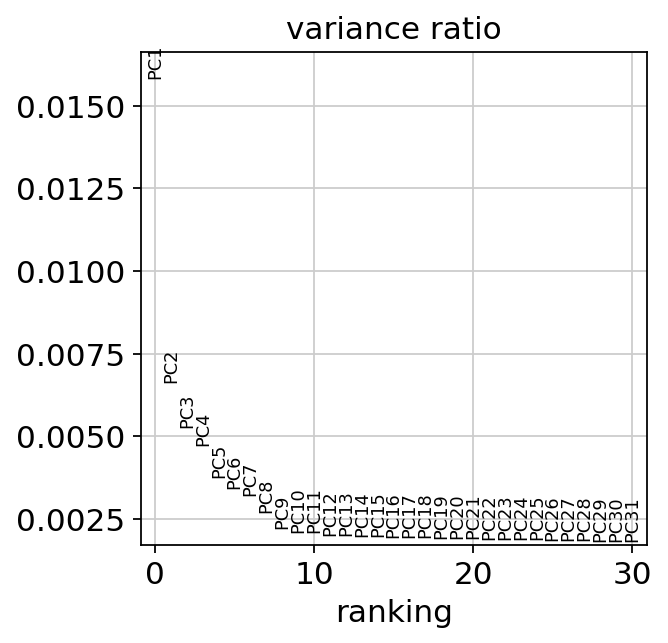

computing neighbors
    using 'X_pca' with n_pcs = 40


/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:00.53) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished (0:00:38.05) --> added
    'X_tsne', tSNE coordinates (adata.obsm)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.07) --> found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
saving figure to file ./figures/tsneUMAP_Kim_RetinaDataSAVER_Kim_Louvain.svg


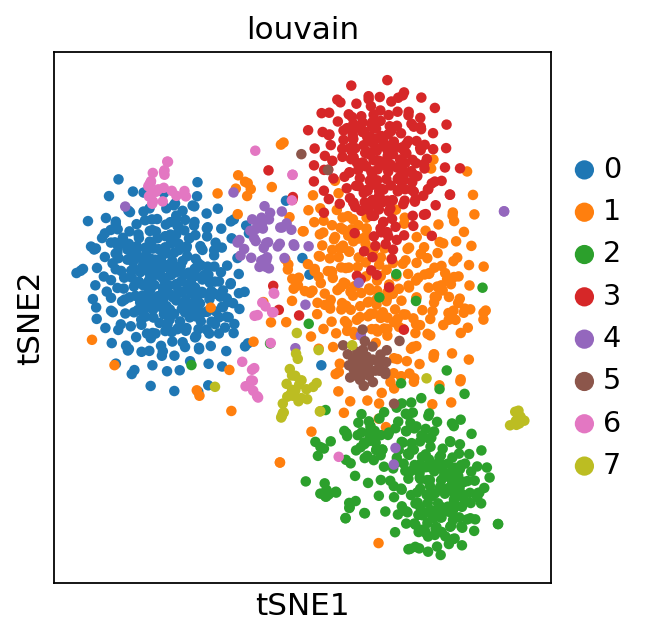

saving figure to file ./figures/dotplotDotplot_Kim_RetinaDataSAVER_Kim_MarkerGenes.svg


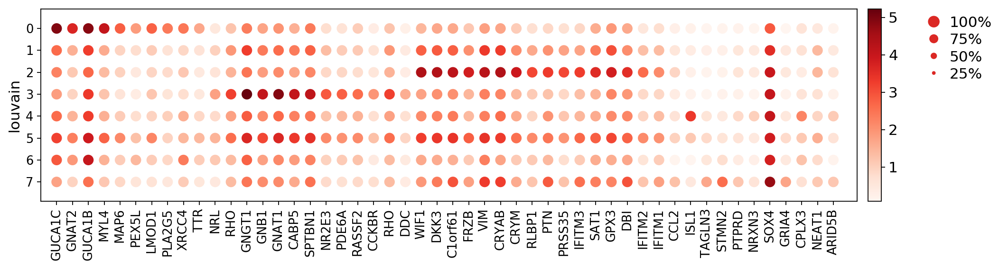

Silhuette coefficient=-0.025830641


In [380]:
ParaTune_Clust(adata_input = adata, 
               marker_genes = MG,  
               cutoff_ngenes = 13369, 
               data_type = 'SAVER_Kim')

In [296]:
Cones = "0"
Rods = '3'
MG = "2"
Rest = '7'
NA = '2', '5', "4", "6"

all_cell_types = [Cones, Rods, MG, Rest, NA]
all_cell_types_names = ["Cones", "Rods", 'MG', "Rest", 'NA']
Get_count_table(adata = adata, all_cell_types = all_cell_types,
               all_cell_types_names = all_cell_types_names)

,CellType,Clusters,Size
0,Cones,0,351
1,Rods,3,243
2,MG,2,266
3,Rest,7,43
4,NA,"('2', '5', '4', '6')",409


In [12]:
# data files
files= ["/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/input/01_Full_Kim_OrganoidData.csv",
"/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_ENHANCE_reform.csv",
"/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF_reform.csv",
"/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_scNPF_String_reform.csv",
"/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_DCA.csv",
"/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_DrImpute_reform.csv",
"/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/RData/02_BeMa_KIM_SAVER_reform.csv"]

# names of imputation
names_Imp = ["sparse", "ENHANCE","scNPF","scNPF_String","DCA","DrImpute", "SAVER"]

# Filter criteria
n_genes = [4000,14000,13369, 13369,14845, 7900, 13369]


normalizing counts per cell
    finished (0:00:00)


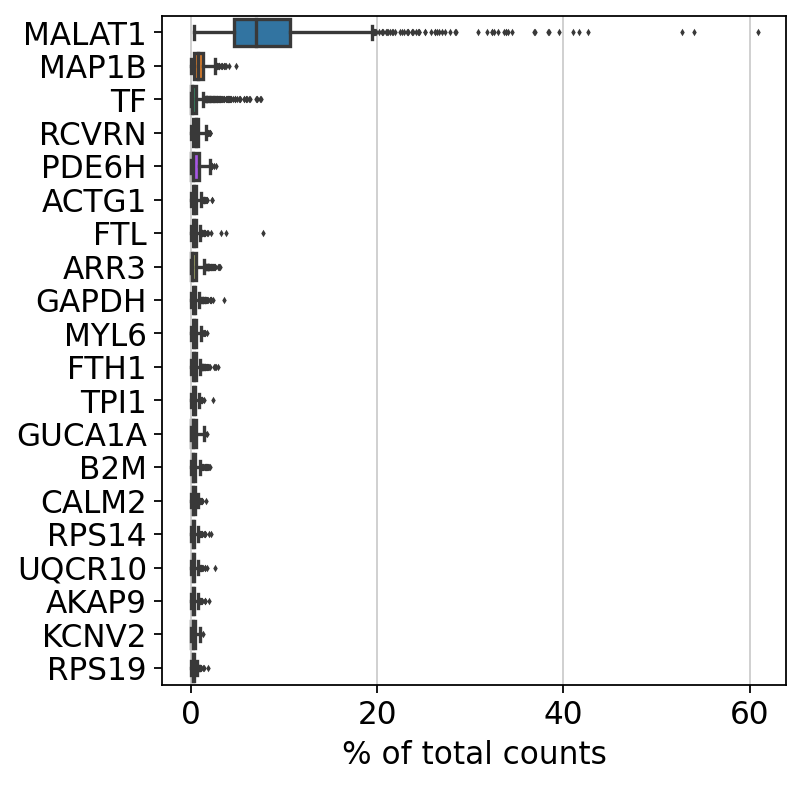

filtered out 94 cells that have less than 600 genes expressed
filtered out 11320 genes that are detected in less than 67 cells


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

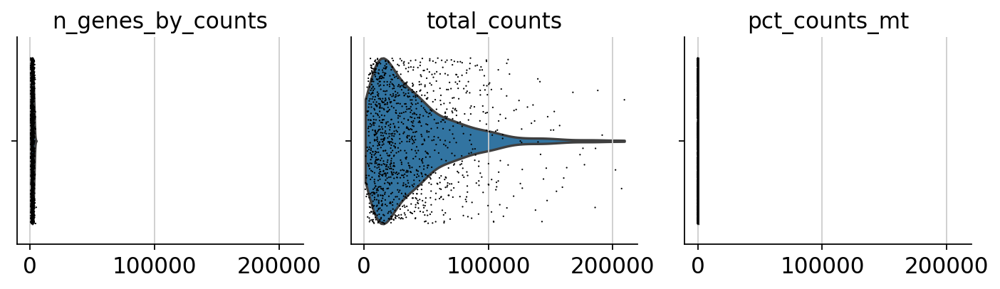

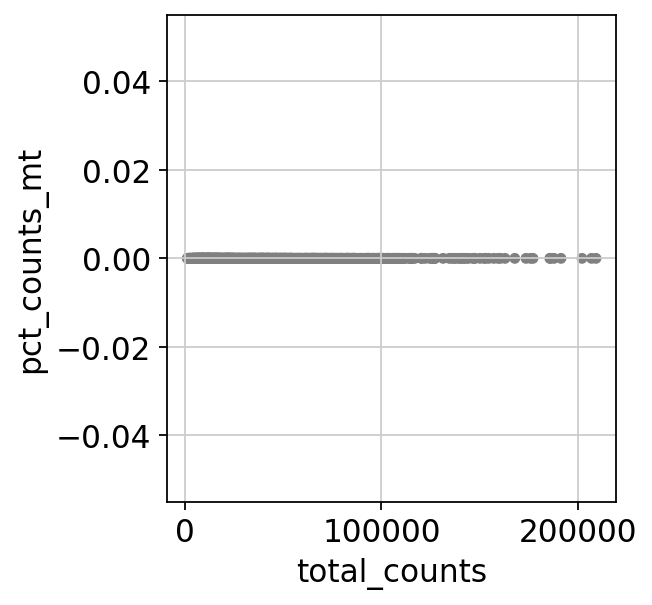

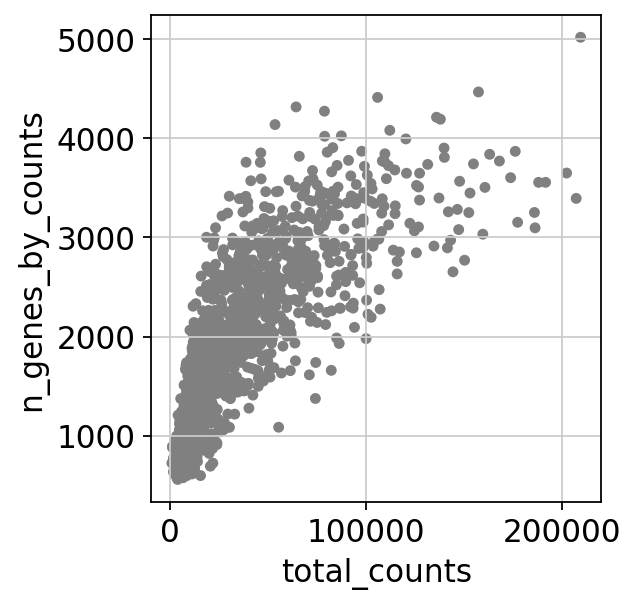

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


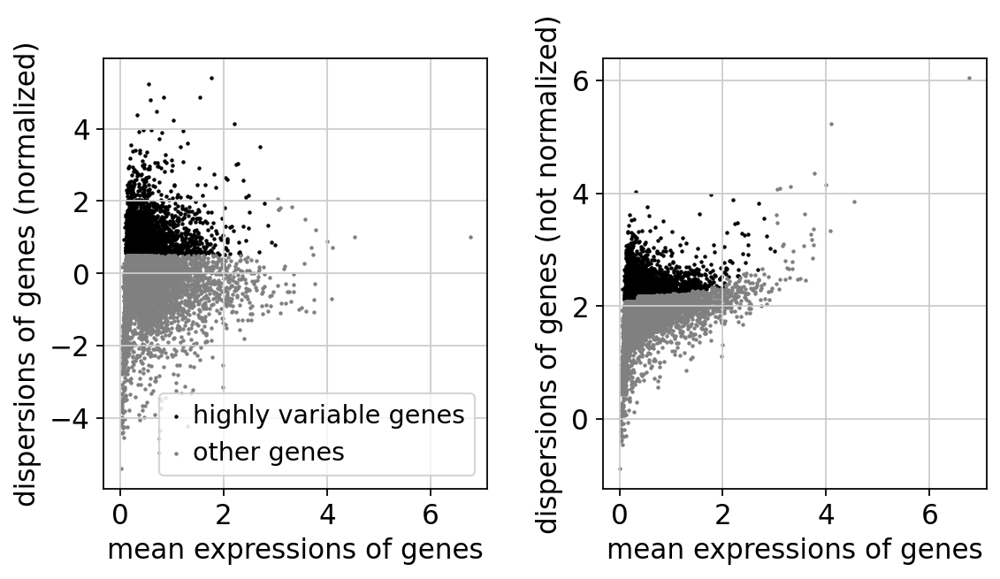

regressing out ['total_counts']
    finished (0:00:20)
computing PCA
    on highly variable genes
    with n_comps=50


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)


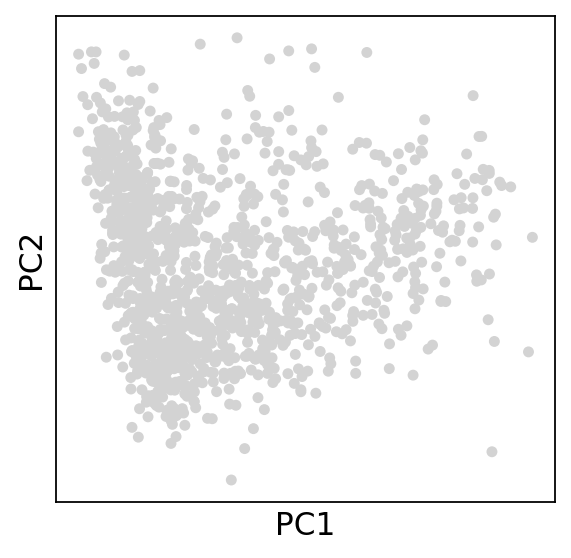

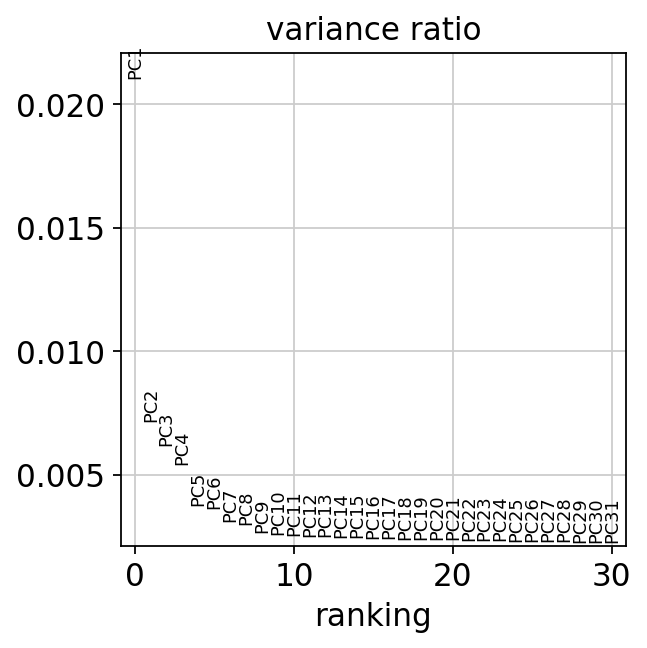

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:09)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


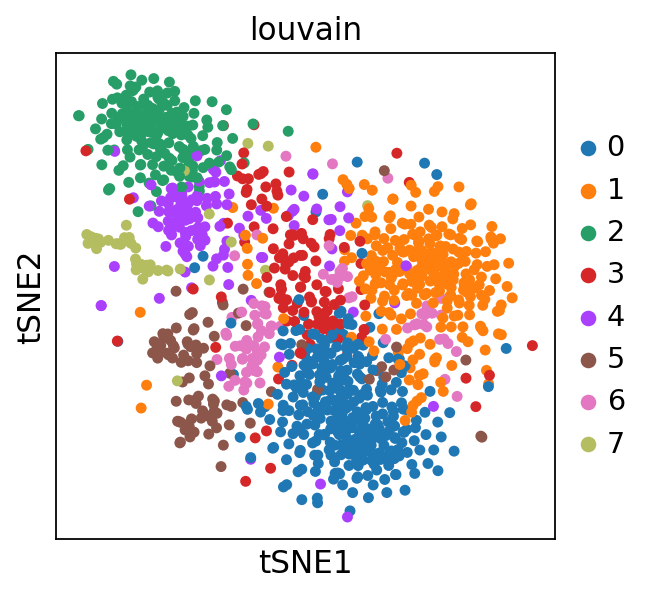

0    323
1    268
2    179
3    125
4    123
5     95
6     83
7     45
Name: louvain, dtype: int64


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


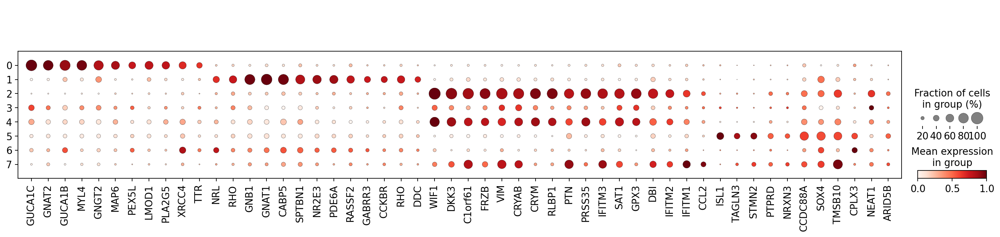

Silhuette coefficient=-0.013677795


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

  CellType      Clusters Size
0    Cones           [0]  323
1     Rods           [1]  268
2       MG        [2, 4]  302
3       NA  [3, 5, 6, 7]  348
4    Mixed            []    0
normalizing counts per cell
    finished (0:00:00)


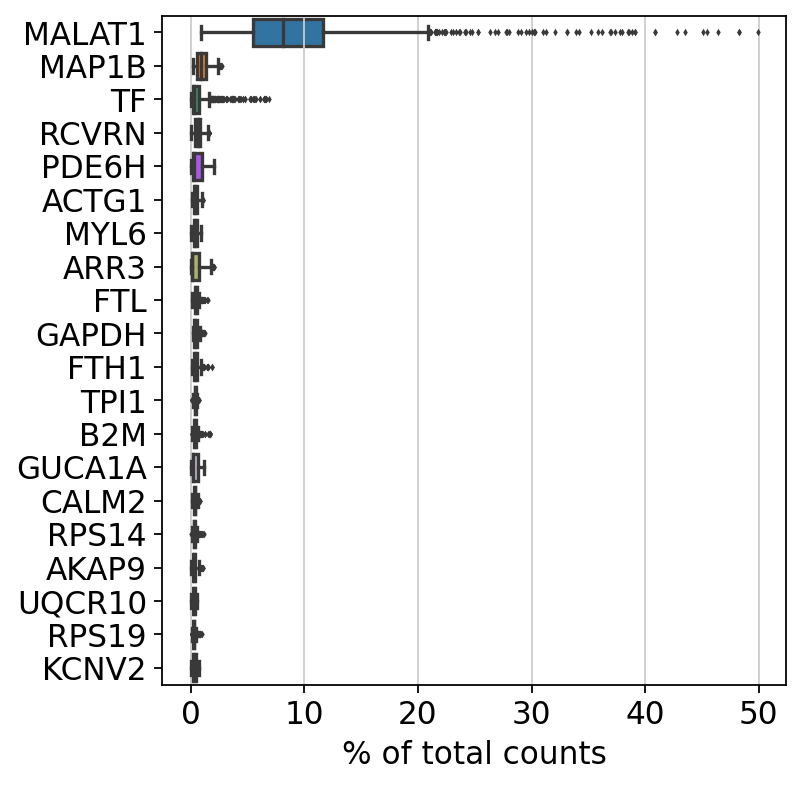

filtered out 5652 genes that are detected in less than 1 counts


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

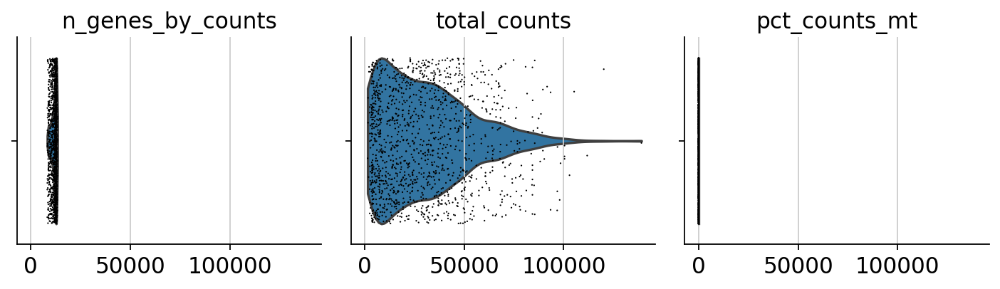

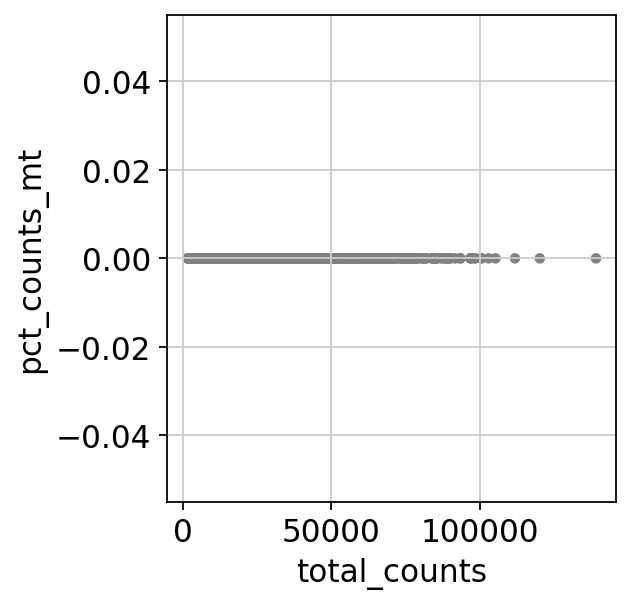

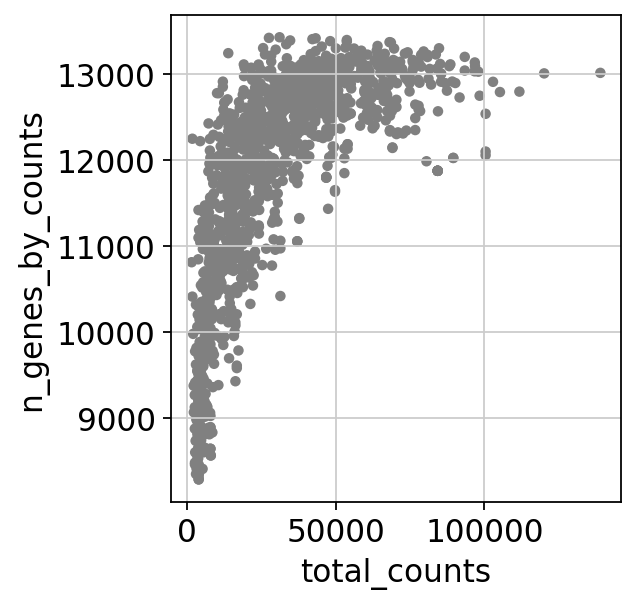

normalizing counts per cell
    finished (0:00:00)


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


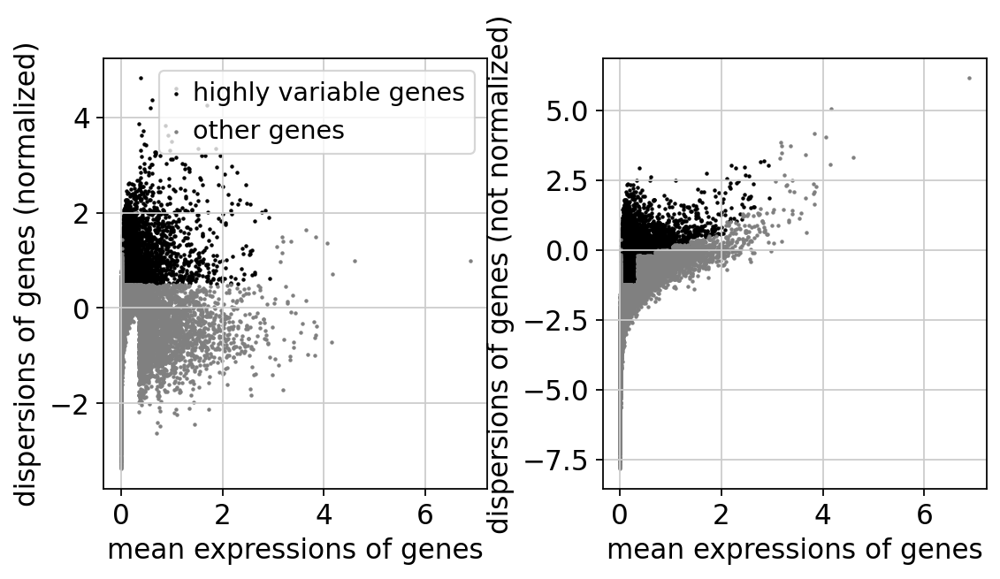

regressing out ['total_counts']
    finished (0:00:08)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


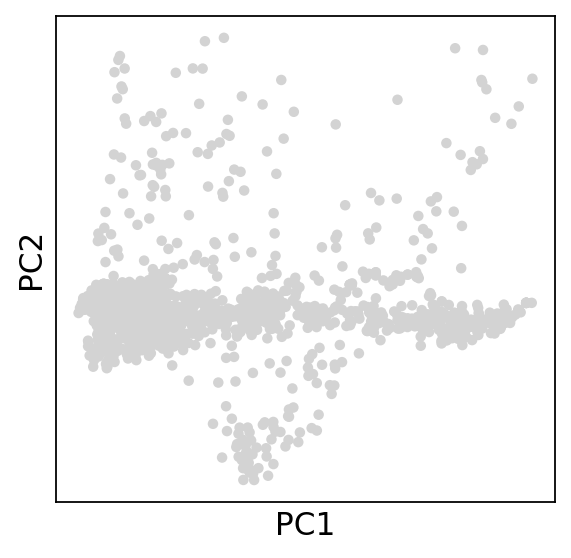

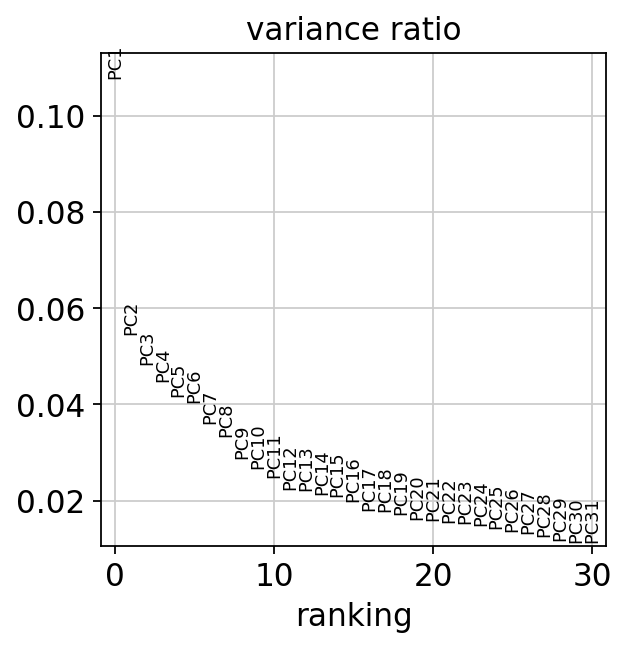

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:09)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 21 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


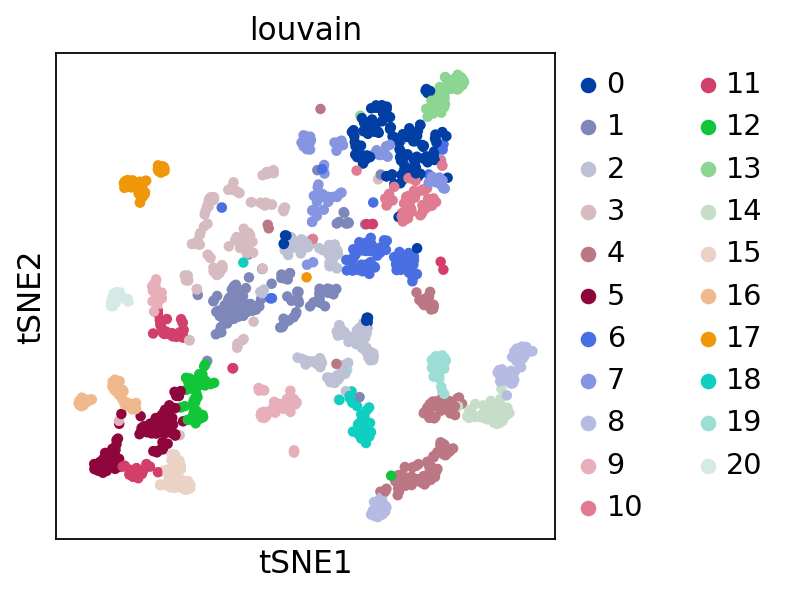

0     128
1     116
2     115
3     104
4     103
5      83
6      78
7      74
8      57
9      54
10     53
11     49
12     47
13     43
14     43
15     41
16     40
17     36
18     36
19     27
20     19
Name: louvain, dtype: int64


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


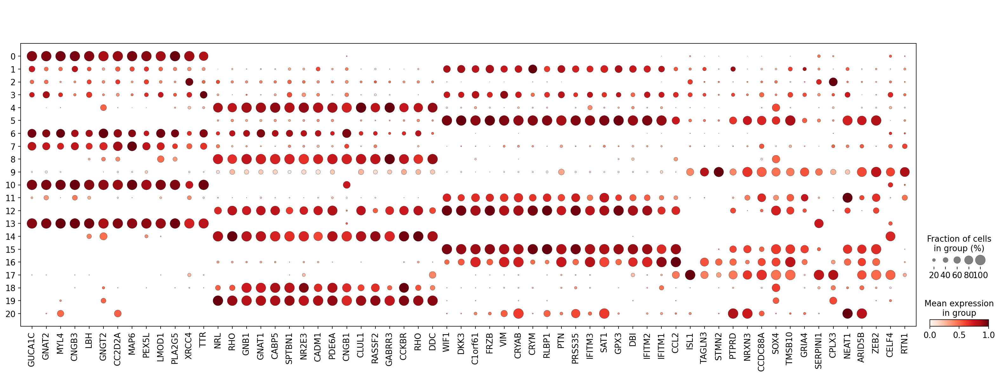

Silhuette coefficient=0.018891657
  CellType                 Clusters Size
0    Cones  [0, 1, 3, 6, 7, 10, 13]  596
1     Rods           [4, 8, 14, 19]  230
2       MG          [5, 11, 15, 16]  213
3       NA       [2, 9, 17, 18, 20]  260
4    Mixed                     [12]   47


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

normalizing counts per cell
    finished (0:00:00)


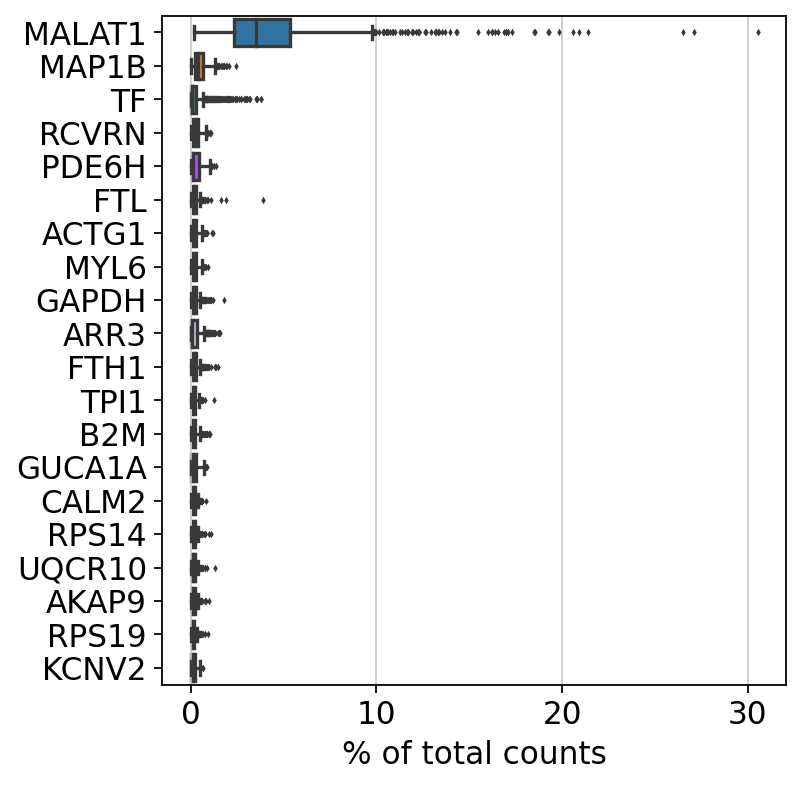

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

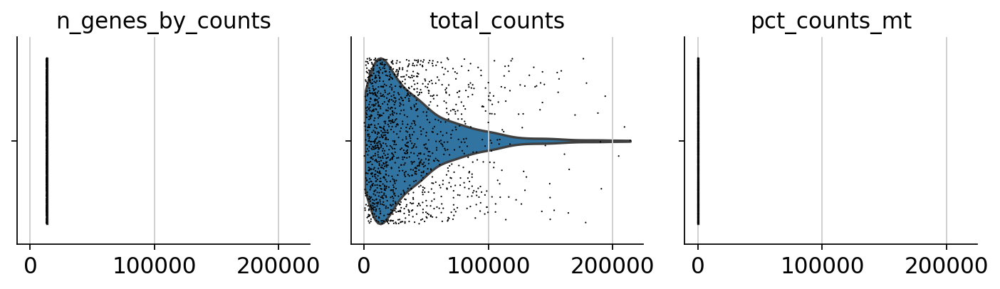

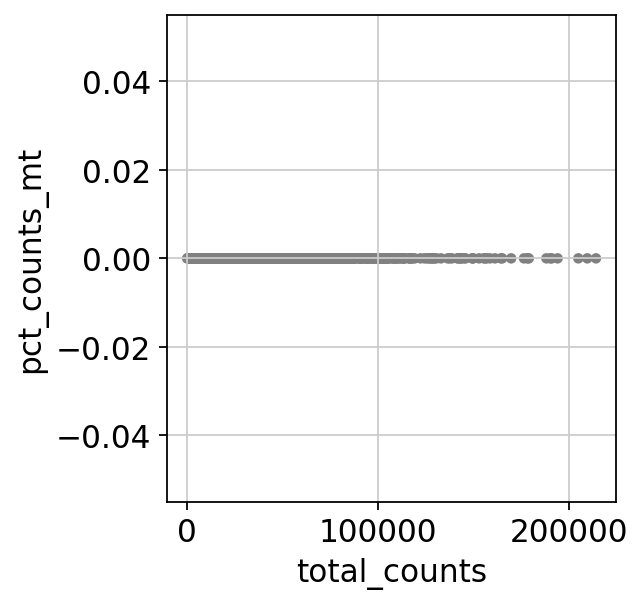

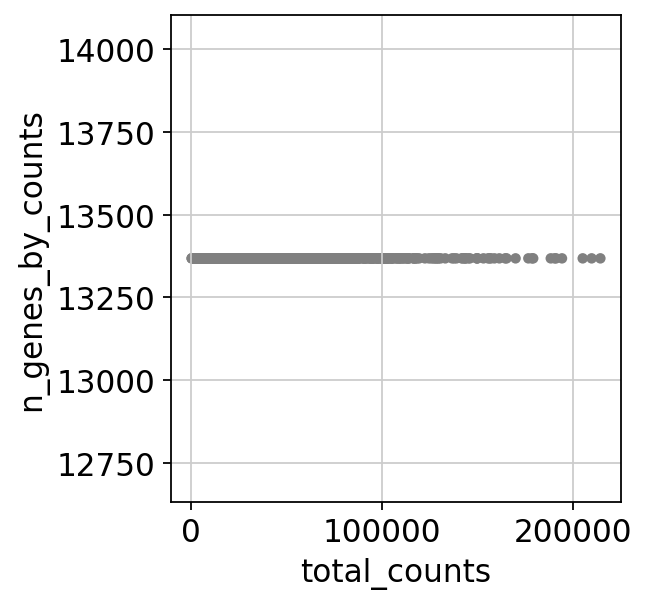

normalizing counts per cell
    finished (0:00:00)


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


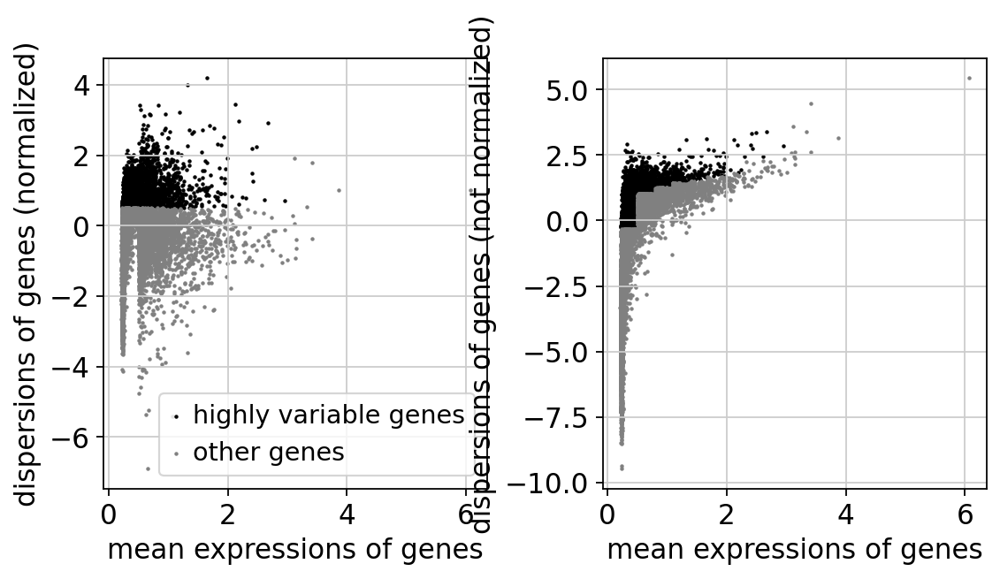

regressing out ['total_counts']
    finished (0:00:10)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


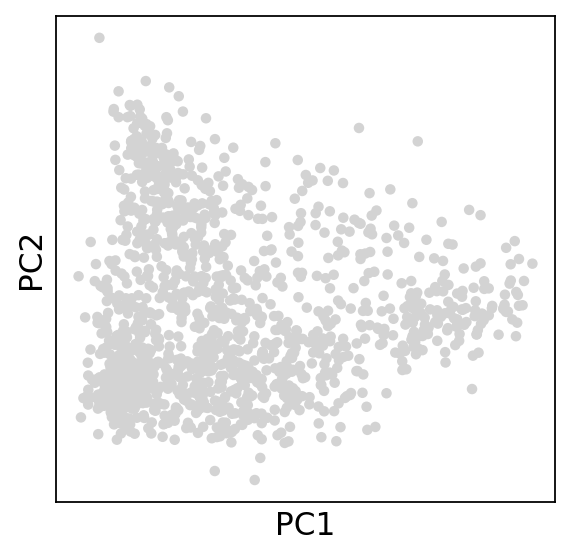

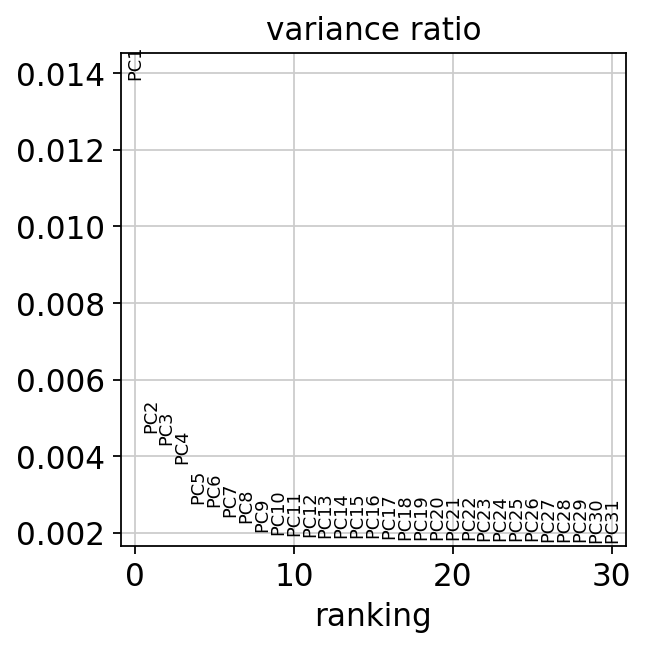

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:10)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


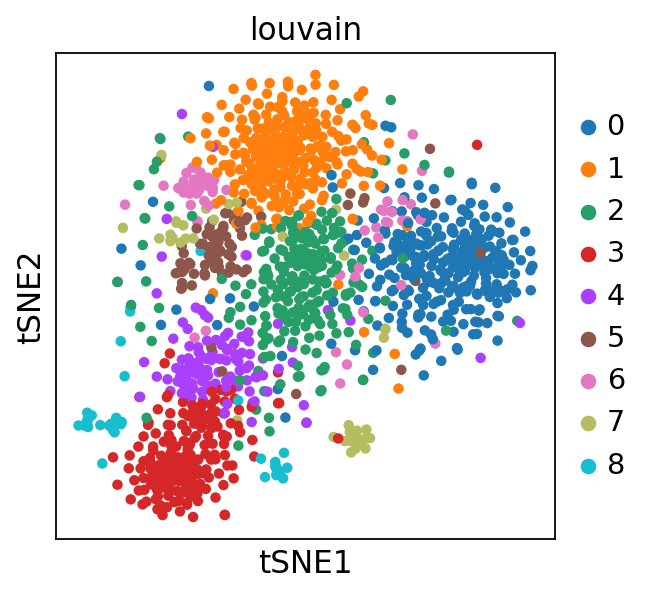

0    293
1    275
2    240
3    196
4    117
5     77
6     60
7     45
8     43
Name: louvain, dtype: int64


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


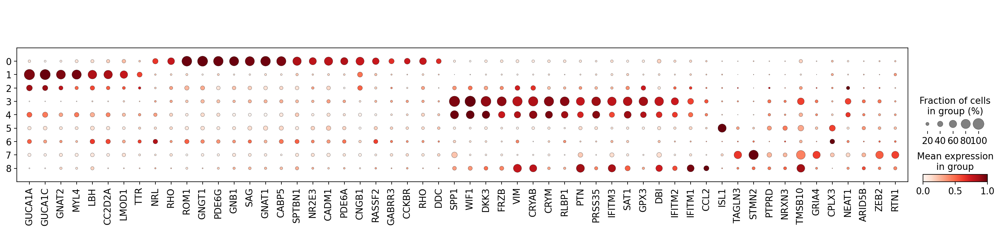

Silhuette coefficient=-0.02968769
  CellType         Clusters Size
0    Cones              [1]  275
1     Rods              [0]  293
2       MG           [3, 4]  313
3       NA  [2, 5, 6, 7, 8]  465
4    Mixed               []    0


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

normalizing counts per cell
    finished (0:00:00)


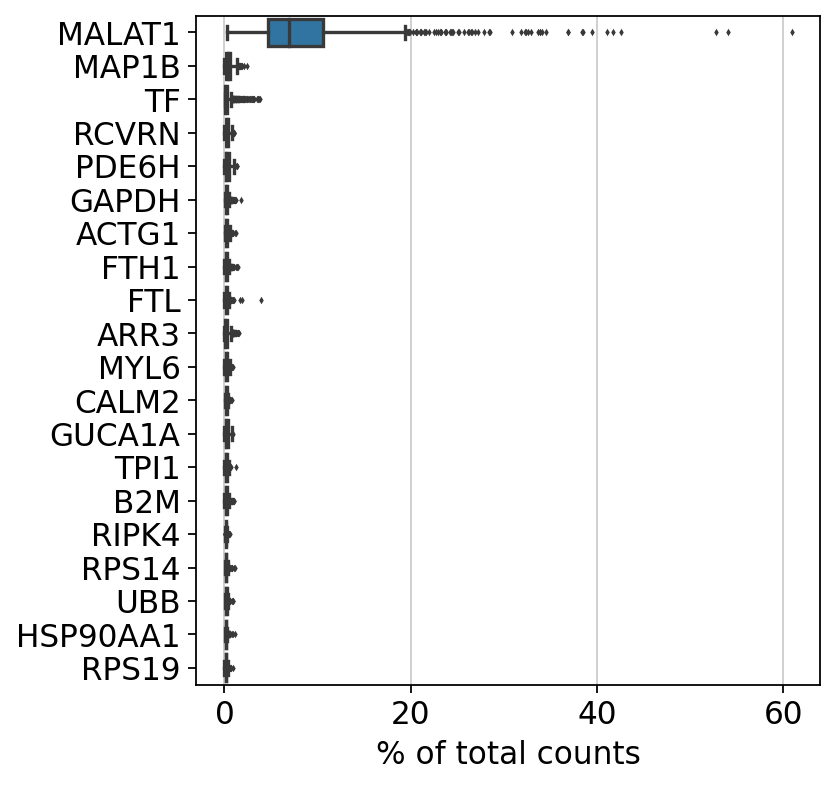

filtered out 1063 genes that are detected in less than 67 cells


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

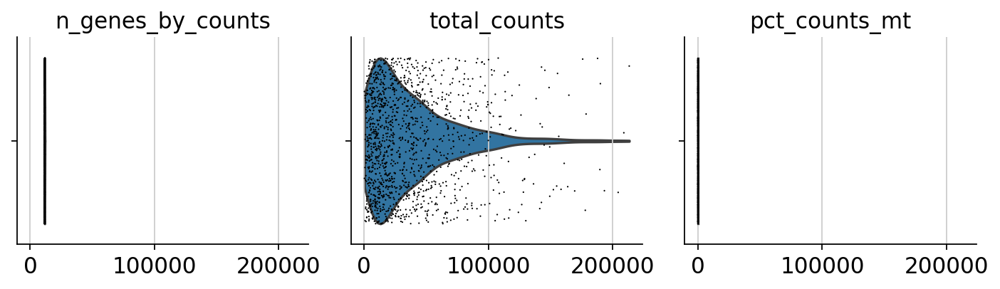

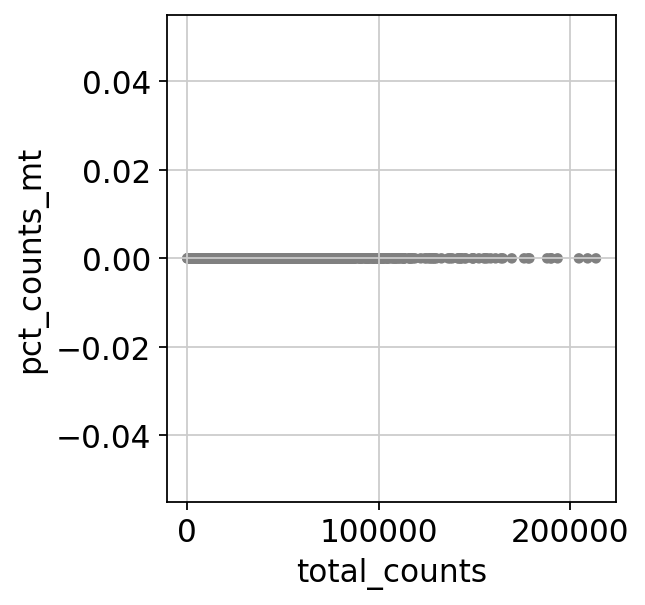

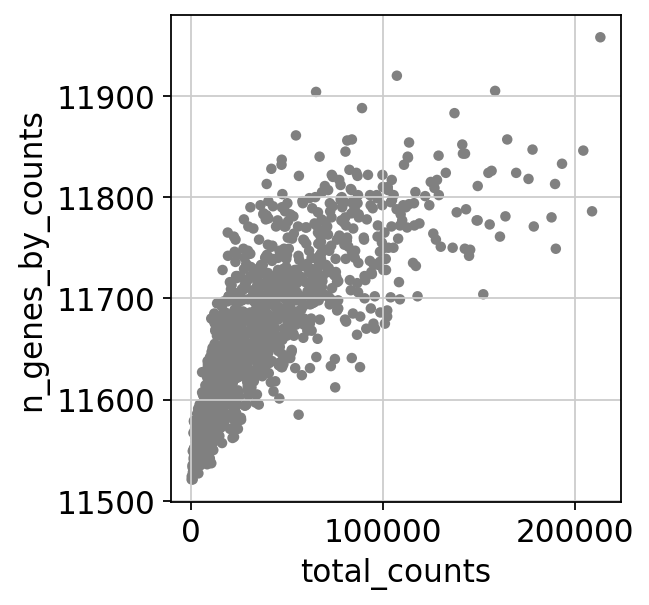

normalizing counts per cell
    finished (0:00:00)


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


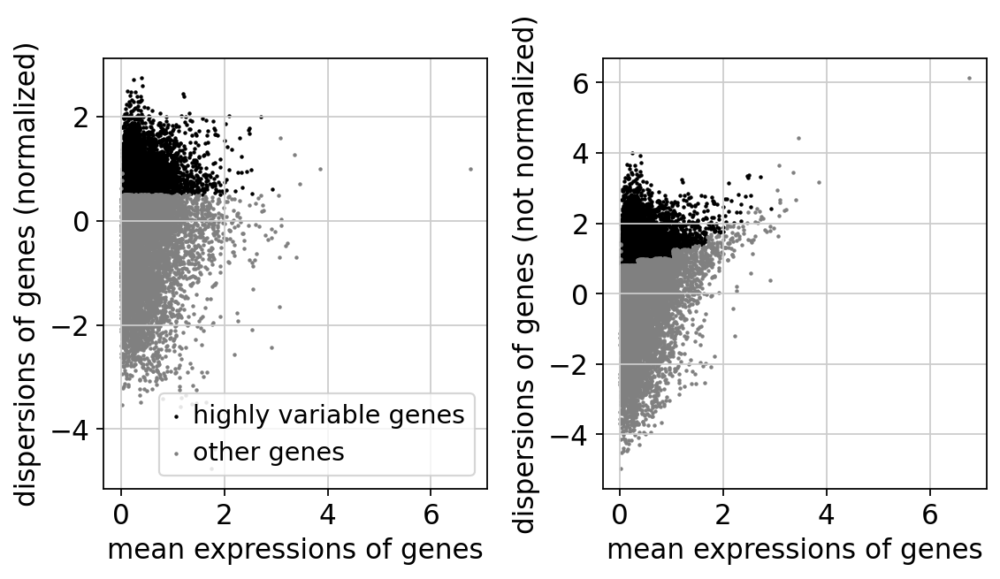

regressing out ['total_counts']
    finished (0:00:09)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


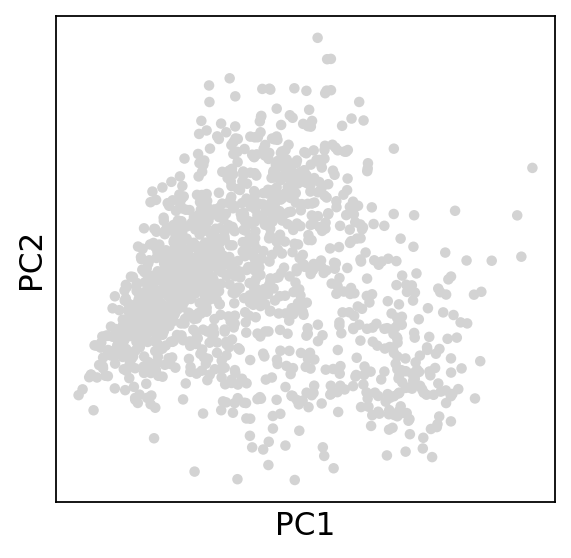

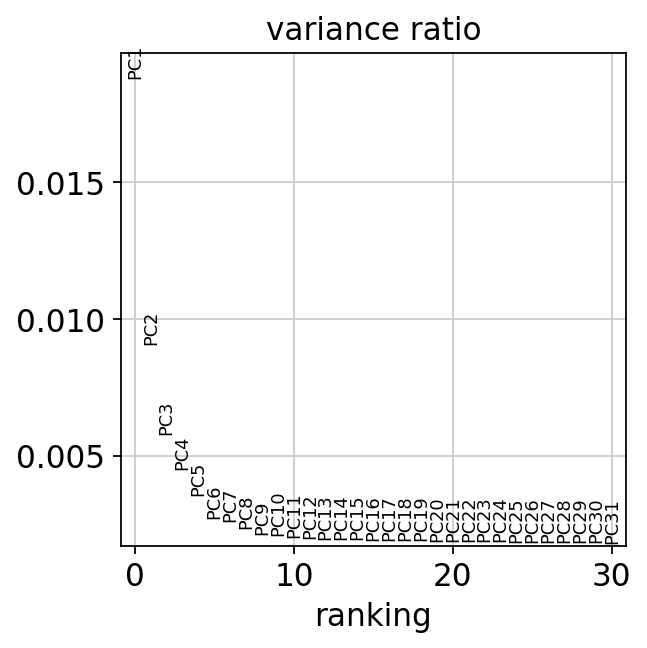

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:11)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


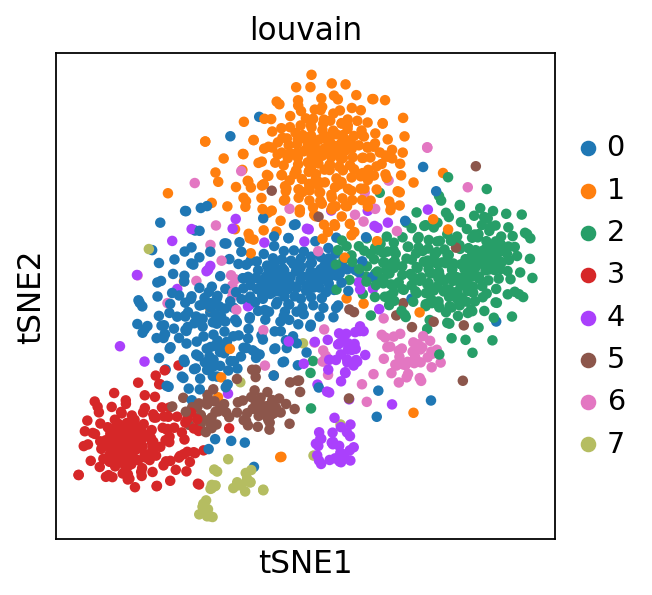

0    322
1    283
2    278
3    160
4     97
5     89
6     78
7     39
Name: louvain, dtype: int64


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


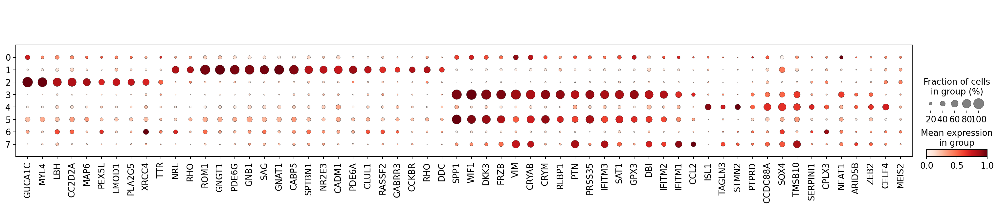

Silhuette coefficient=-0.021369416
  CellType      Clusters Size
0    Cones           [2]  278
1     Rods           [1]  283
2       MG        [3, 5]  249
3       NA  [0, 4, 6, 7]  536
4    Mixed            []    0


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

normalizing counts per cell
    finished (0:00:00)


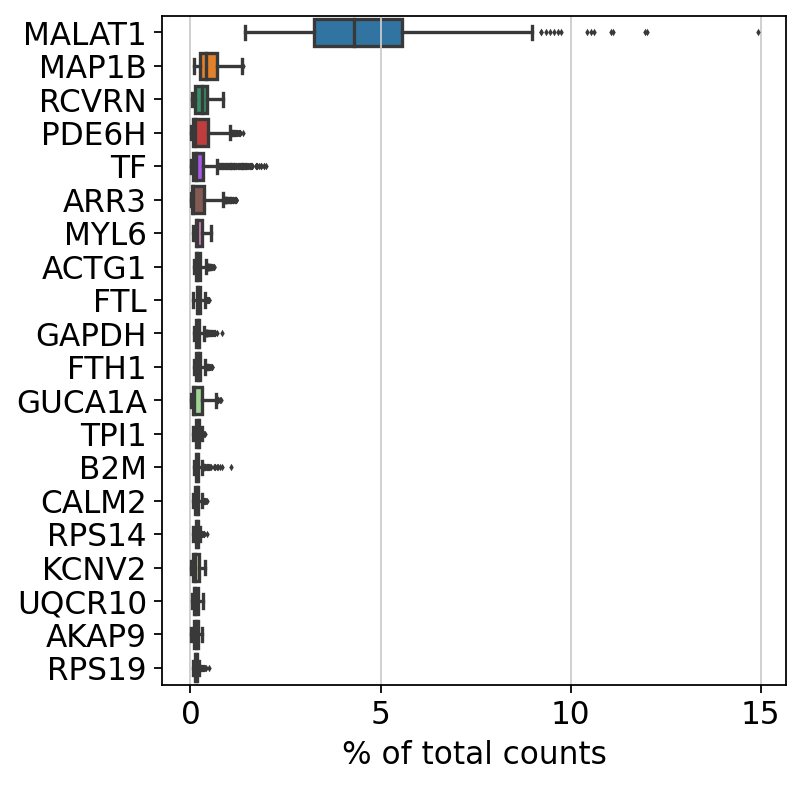

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

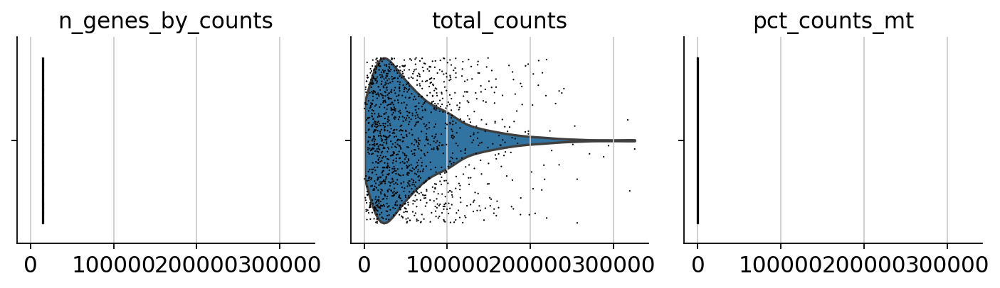

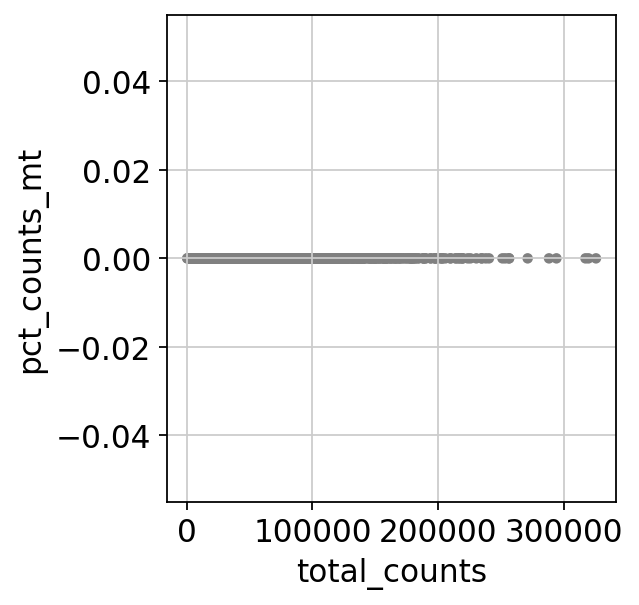

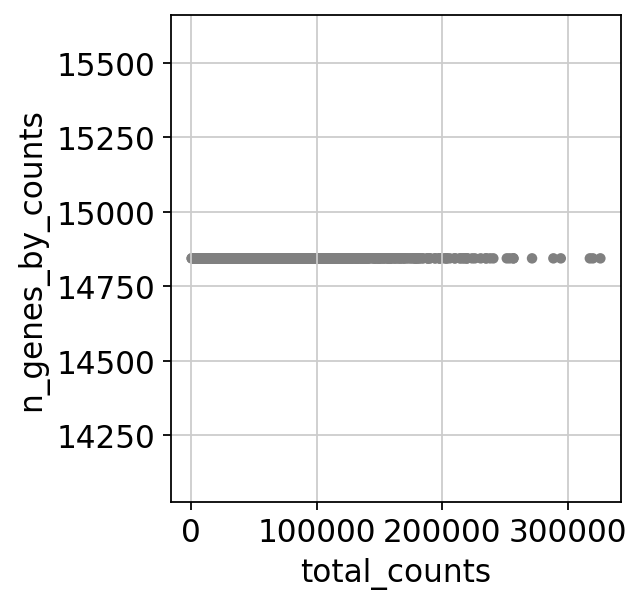

normalizing counts per cell
    finished (0:00:00)


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


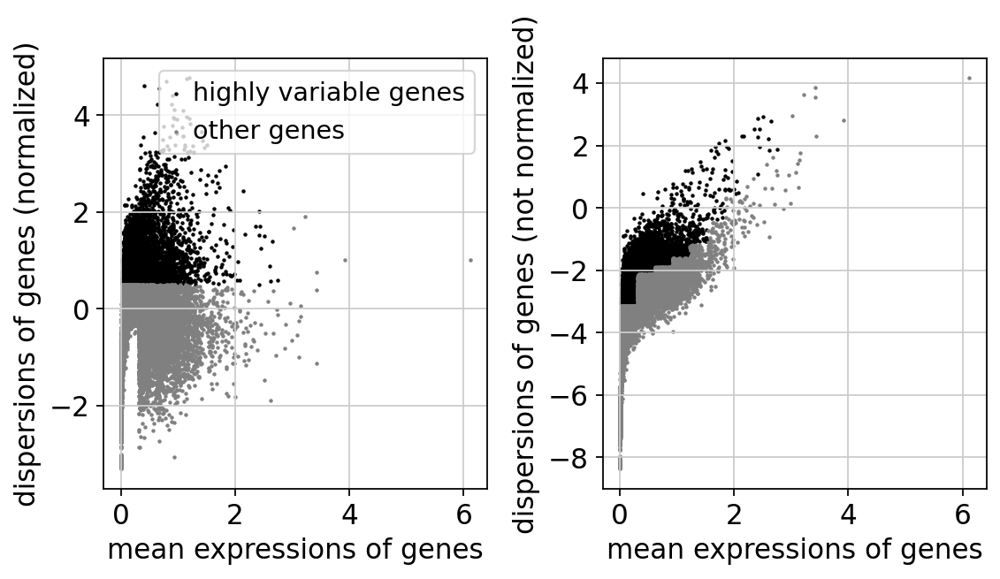

regressing out ['total_counts']
    finished (0:00:09)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


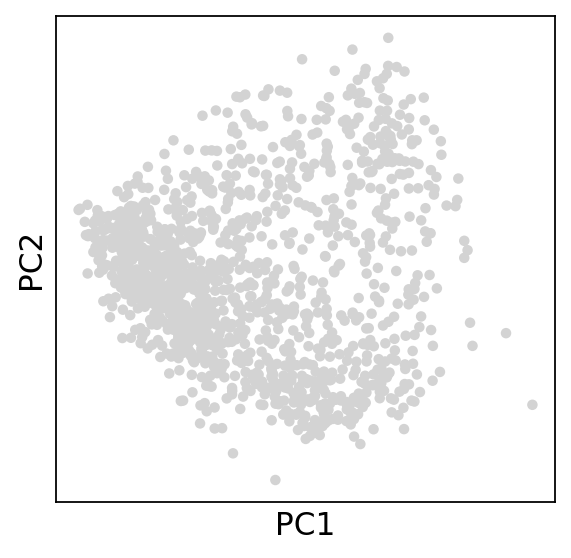

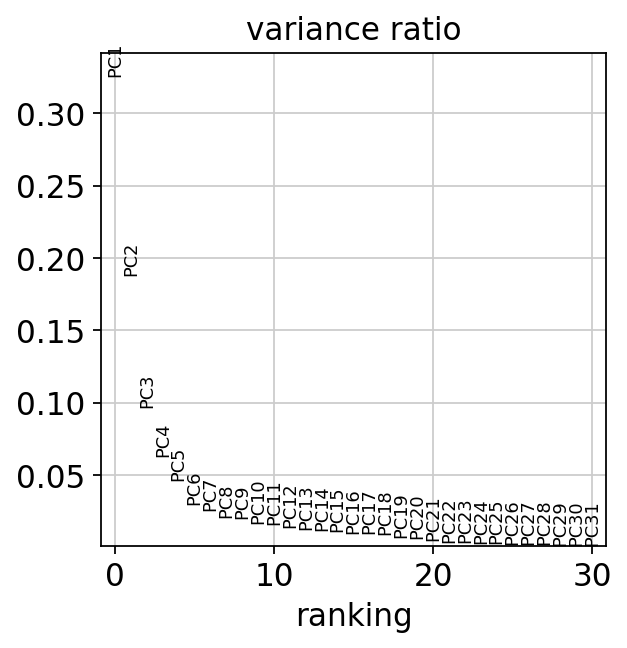

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:08)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


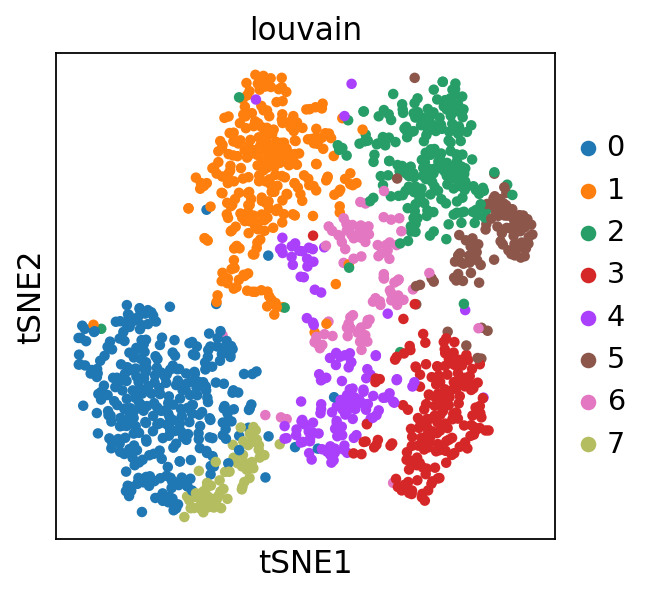

0    325
1    273
2    208
3    175
4    127
5     90
6     86
7     62
Name: louvain, dtype: int64


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


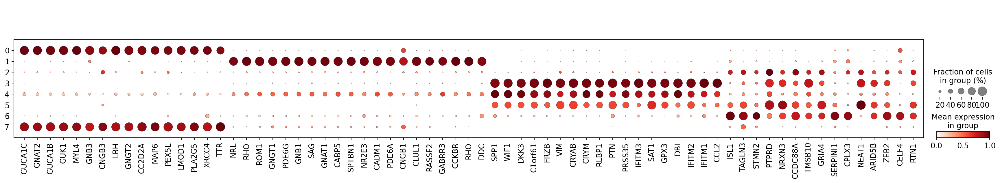

Silhuette coefficient=0.13537222
  CellType   Clusters Size
0    Cones     [0, 7]  387
1     Rods        [1]  273
2       MG  [3, 4, 5]  392
3       NA     [2, 6]  294
4    Mixed         []    0


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

normalizing counts per cell
    finished (0:00:00)


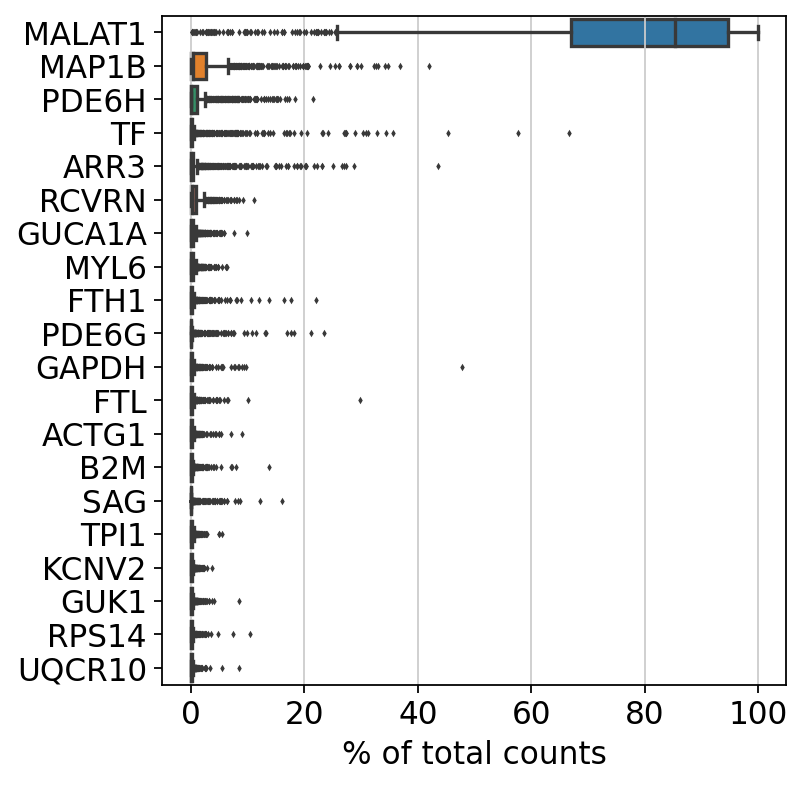

filtered out 4988 genes that are detected in less than 67 cells


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

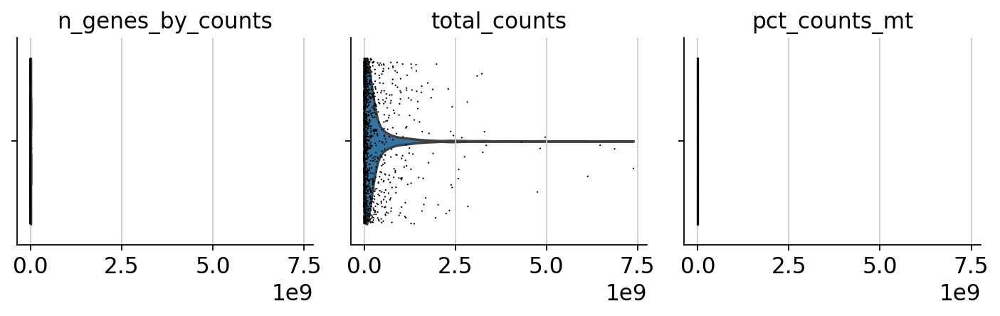

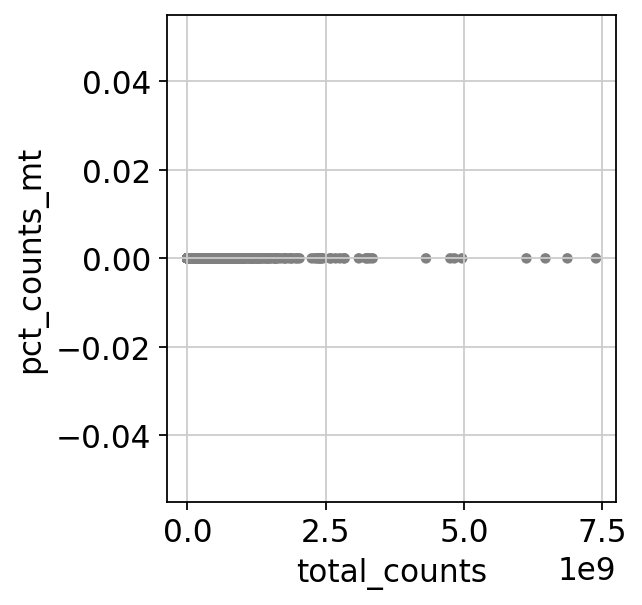

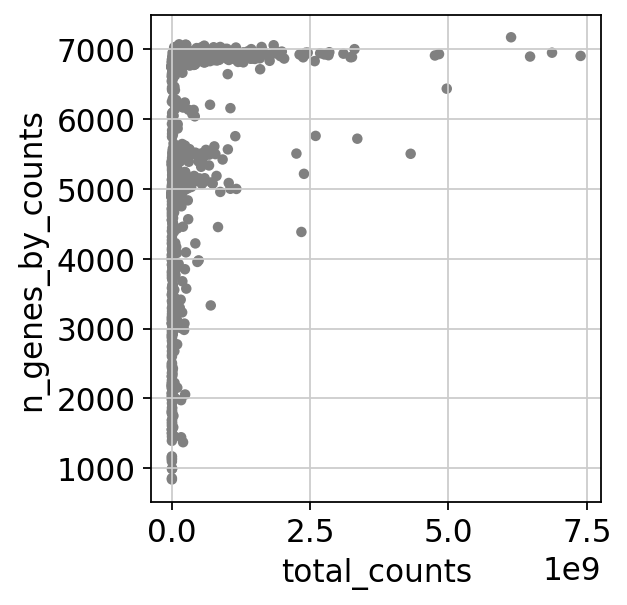

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


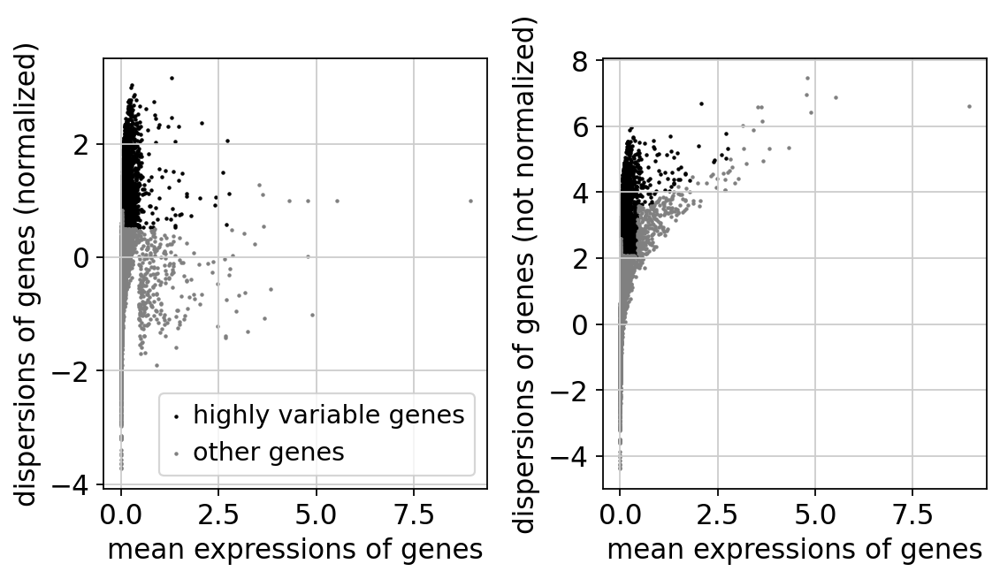

regressing out ['total_counts']
    finished (0:00:05)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


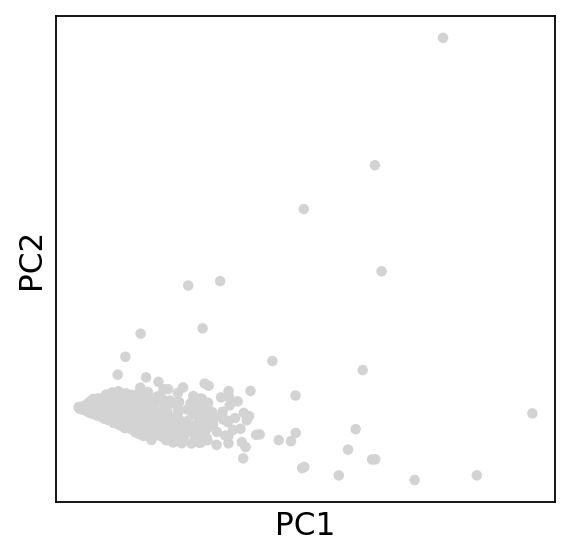

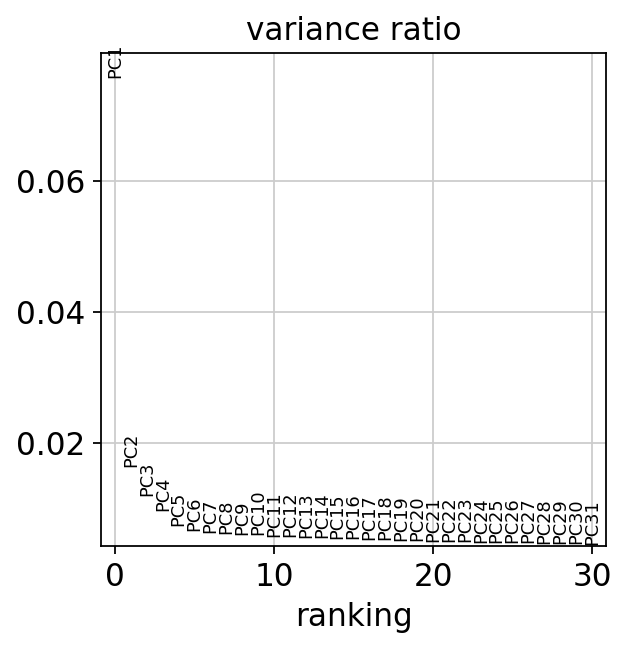

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:09)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


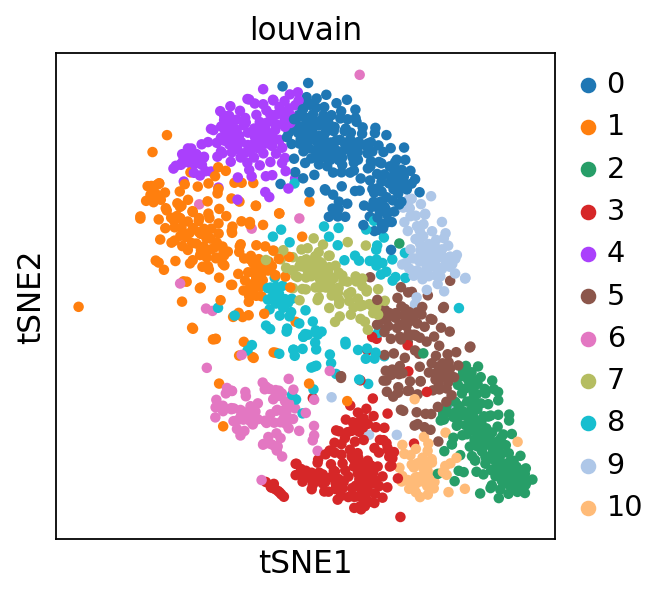

0     195
1     190
2     155
3     149
4     132
5     117
8      94
7      94
6      94
9      80
10     46
Name: louvain, dtype: int64


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


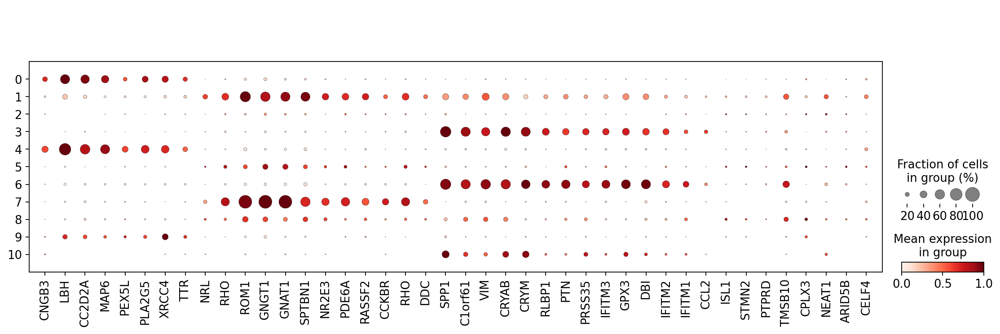

Silhuette coefficient=-0.17526397
  CellType          Clusters Size
0    Cones            [0, 4]  327
1     Rods            [1, 7]  284
2       MG            [3, 6]  243
3       NA  [2, 5, 8, 9, 10]  492
4    Mixed                []    0


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

normalizing counts per cell
    finished (0:00:00)


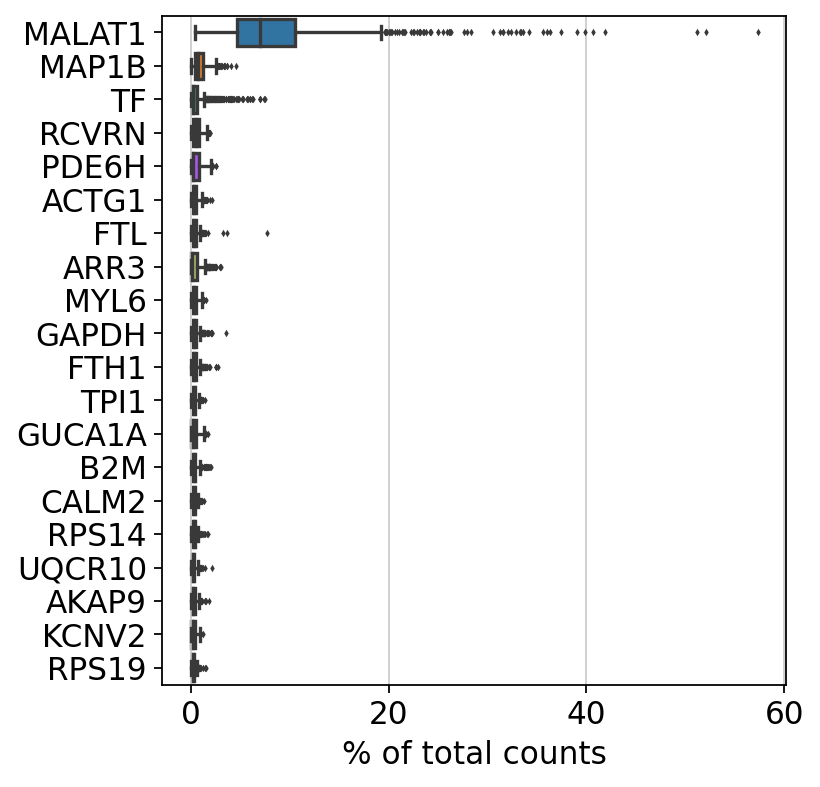

/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/sea

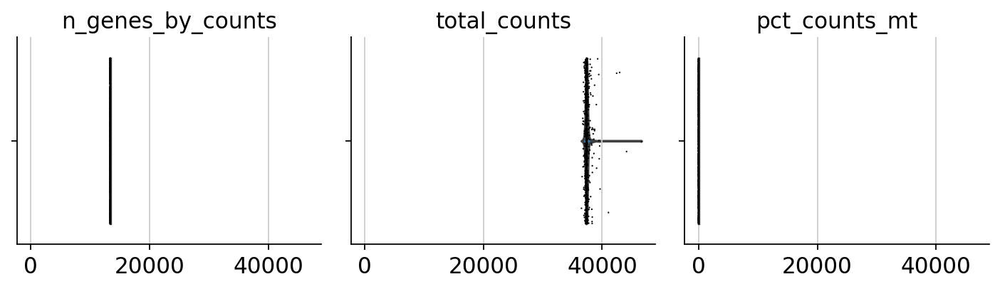

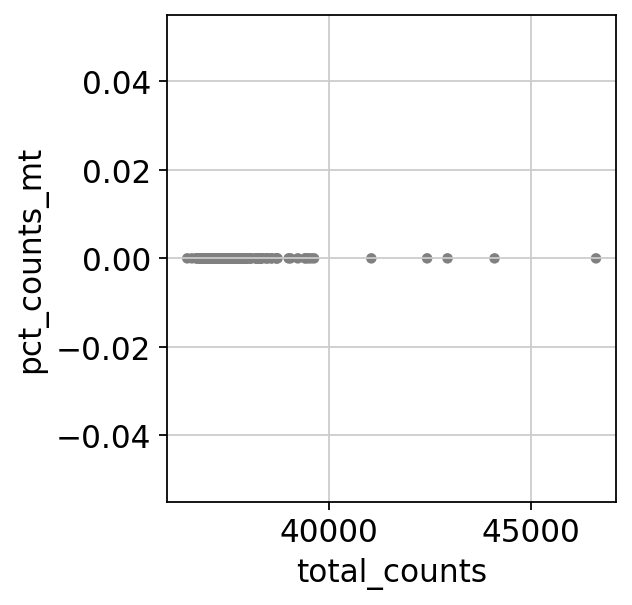

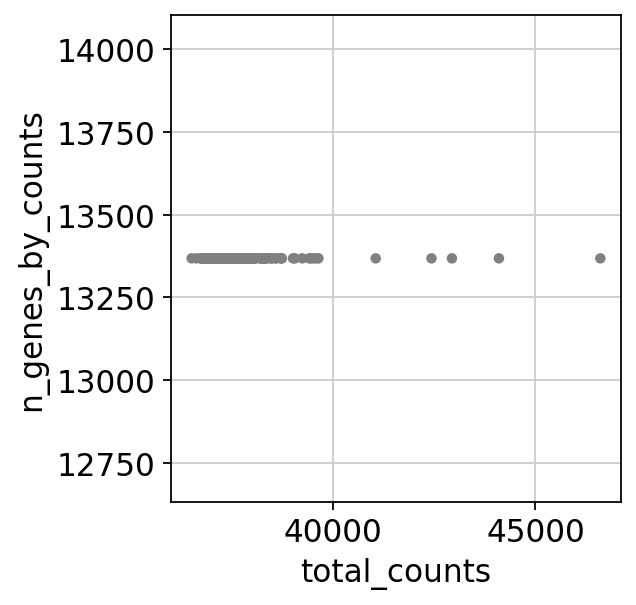

normalizing counts per cell
    finished (0:00:00)


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


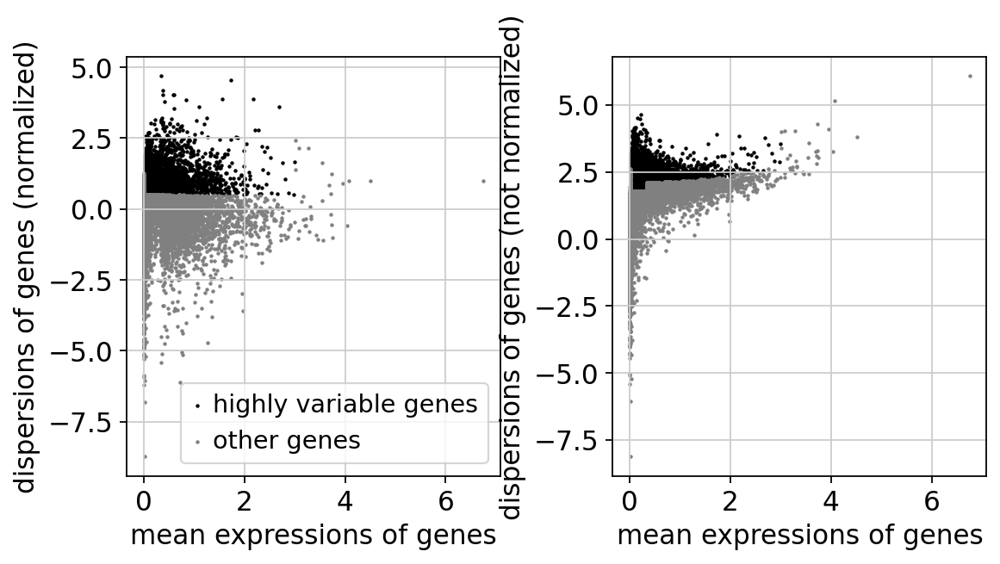

regressing out ['total_counts']
    finished (0:00:08)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


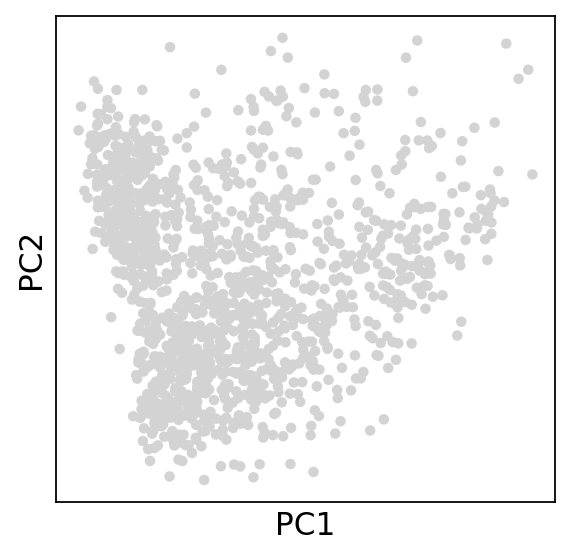

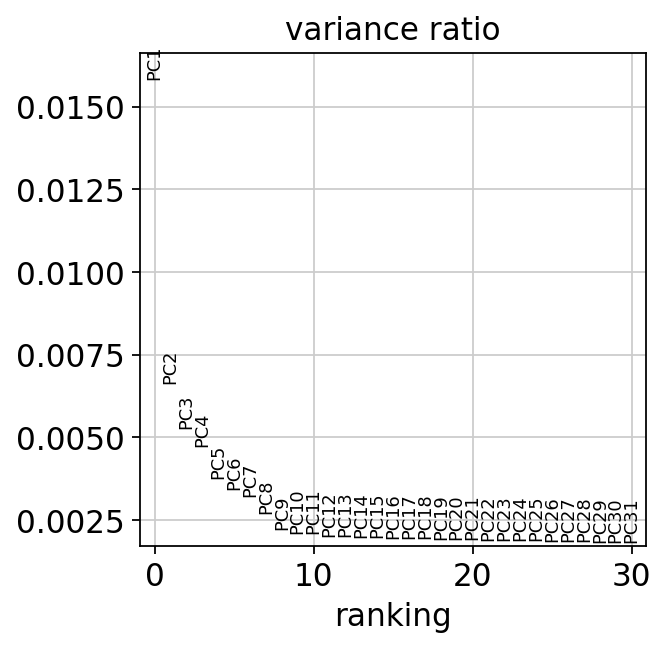

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:10)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


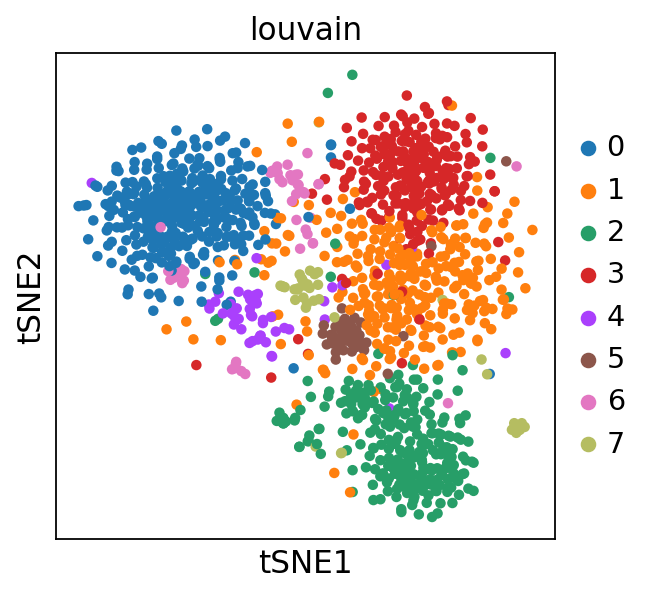

0    351
1    300
2    266
3    243
4     49
5     48
6     46
7     43
Name: louvain, dtype: int64


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


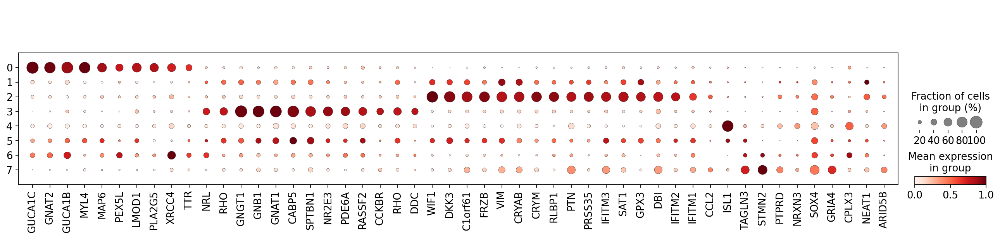

Silhuette coefficient=-0.025830543
  CellType         Clusters Size
0    Cones              [0]  351
1     Rods              [3]  243
2       MG              [2]  266
3       NA  [1, 4, 5, 6, 7]  486
4    Mixed               []    0


/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/global/apps/bioinf/conda_envs/scanpy_1.6.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
<ipython-input-8-d88a69d5d760>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset=Final_annot[Final_annot["Pure"] == True][Final_annot[str(cell_type)]==1]
<ipython-input-8-d88a69d5d760>:

NameError: name 'b' is not defined

In [13]:
final_result = pd.DataFrame(index= names_Imp, columns = [ "Silcoef","Number Clusters","Cones(%)", "Rods(%)", "MG(%)", "NA(%)", "Mixed(%)", "Pure Clusters(%)"])
for i in range(0,len(files)):
    if names_Imp[i] == "DCA":
        PreprocessSC(data_path = files[i],data_type = names_Imp[i], transpose_data = False)
    else:
        PreprocessSC(data_path = files[i],data_type = names_Imp[i], transpose_data = True)
    
    ParaTune_Clust(adata_input = adata,  marker_genes = MG, cutoff_ngenes = n_genes[i], data_type = names_Imp[i])
    
    final_result.iloc[i,0] = mean_sil
    final_result.iloc[i,1] = len(adata.obs["louvain"].cat.categories)
    
    Automatic_Annotation(adata_input = adata, data_set= names_Imp[i])
    
    final_result.iloc[i,2:7] = pd.array(annot_table["Size"])/adata.X.shape[0]*100
    perc =pd.array(annot_table["Size"])/adata.X.shape[0]
    final_result.iloc[i,7] = sum(perc[0:3])*100
    
    
final_result.to_csv('/work/steinheu/2020_Benchmarking_Imp/Retina_Markers/results/03_Combined_Kim_Annotation.csv')
final_result